# Project: Data Wrangling

In [124]:
#Libraries to be used

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import json
import os
import requests
import tweepy
from tweepy import OAuthHandler
from timeit import default_timer as timer
import warnings
warnings.filterwarnings('ignore')
from PIL import Image 
from io import BytesIO
from collections import Counter

## Data Gathering
In the cell below, gather **all** three pieces of data for this project and load them in the notebook. **Note:** the methods required to gather each data are different.
###  Directly download the WeRateDogs Twitter archive data (twitter_archive_enhanced.csv)

## twitter-archive-enhanced

In [4]:
#read twitter archive data
twit_archive = pd.read_csv('twitter-archive-enhanced.csv')


In [5]:
# Read the first 10 rows
twit_archive.head(10)

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
0,892420643555336193,NaN,NaN,2017-08-01 16:23:56 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Phineas. He's a mystical boy. Only eve...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/892420643...,13,10,Phineas,None,None,None,None
1,892177421306343426,NaN,NaN,2017-08-01 00:17:27 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Tilly. She's just checking pup on you....,NaN,NaN,NaN,https://twitter.com/dog_rates/status/892177421...,13,10,Tilly,None,None,None,None
2,891815181378084864,NaN,NaN,2017-07-31 00:18:03 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Archie. He is a rare Norwegian Pouncin...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891815181...,12,10,Archie,None,None,None,None
3,891689557279858688,NaN,NaN,2017-07-30 15:58:51 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Darla. She commenced a snooze mid meal...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891689557...,13,10,Darla,None,None,None,None
4,891327558926688256,NaN,NaN,2017-07-29 16:00:24 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Franklin. He would like you to stop ca...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891327558...,12,10,Franklin,None,None,None,None
5,891087950875897856,NaN,NaN,2017-07-29 00:08:17 +0000,"<a href=""http://twitter.com/download/iphone"" r...",Here we have a majestic great white breaching ...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891087950...,13,10,None,None,None,None,None
6,890971913173991426,NaN,NaN,2017-07-28 16:27:12 +0000,"<a href=""http://twitter.com/download/iphone"" r...",Meet Jax. He enjoys ice cream so much he gets ...,NaN,NaN,NaN,"https://gofundme.com/ydvmve-surgery-for-jax,ht...",13,10,Jax,None,None,None,None
7,890729181411237888,NaN,NaN,2017-07-28 00:22:40 +0000,"<a href=""http://twitter.com/download/iphone"" r...",When you watch your owner call another dog a g...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/890729181...,13,10,None,None,None,None,None
8,890609185150312448,NaN,NaN,2017-07-27 16:25:51 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Zoey. She doesn't want to be one of th...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/890609185...,13,10,Zoey,None,None,None,None
9,890240255349198849,NaN,NaN,2017-07-26 15:59:51 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Cassie. She is a college pup. Studying...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/890240255...,14,10,Cassie,doggo,None,None,None


## 2. Use the Requests library to download the tweet image prediction (image_predictions.tsv)

## image_predictions

In [6]:
#Download image predictions using the Requests library from Udacity server and write it to image_predictions.tsv
url = 'https://d17h27t6h515a5.cloudfront.net/topher/2017/August/599fd2ad_image-predictions/image-predictions.tsv'
response = requests.get(url)

#create image_preds 
with open('image_predictions.tsv', mode='wb') as file:
    file.write(response.content)
    
#Read into a DataFrame
image_pred = pd.read_csv('image_predictions.tsv', sep='\t')

In [7]:
#Read top 10 rows
image_pred.head(10)

,tweet_id,jpg_url,img_num,p1,p1_conf,p1_dog,p2,p2_conf,p2_dog,p3,p3_conf,p3_dog
0,666020888022790149,https://pbs.twimg.com/media/CT4udn0WwAA0aMy.jpg,1,Welsh_springer_spaniel,0.465074,True,collie,0.156665,True,Shetland_sheepdog,0.061428,True
1,666029285002620928,https://pbs.twimg.com/media/CT42GRgUYAA5iDo.jpg,1,redbone,0.506826,True,miniature_pinscher,0.074192,True,Rhodesian_ridgeback,0.072010,True
2,666033412701032449,https://pbs.twimg.com/media/CT4521TWwAEvMyu.jpg,1,German_shepherd,0.596461,True,malinois,0.138584,True,bloodhound,0.116197,True
3,666044226329800704,https://pbs.twimg.com/media/CT5Dr8HUEAA-lEu.jpg,1,Rhodesian_ridgeback,0.408143,True,redbone,0.360687,True,miniature_pinscher,0.222752,True
4,666049248165822465,https://pbs.twimg.com/media/CT5IQmsXIAAKY4A.jpg,1,miniature_pinscher,0.560311,True,Rottweiler,0.243682,True,Doberman,0.154629,True
5,666050758794694657,https://pbs.twimg.com/media/CT5Jof1WUAEuVxN.jpg,1,Bernese_mountain_dog,0.651137,True,English_springer,0.263788,True,Greater_Swiss_Mountain_dog,0.016199,True
6,666051853826850816,https://pbs.twimg.com/media/CT5KoJ1WoAAJash.jpg,1,box_turtle,0.933012,False,mud_turtle,0.045885,False,terrapin,0.017885,False
7,666055525042405380,https://pbs.twimg.com/media/CT5N9tpXIAAifs1.jpg,1,chow,0.692517,True,Tibetan_mastiff,0.058279,True,fur_coat,0.054449,False
8,666057090499244032,https://pbs.twimg.com/media/CT5PY90WoAAQGLo.jpg,1,shopping_cart,0.962465,False,shopping_basket,0.014594,False,golden_retriever,0.007959,True
9,666058600524156928,https://pbs.twimg.com/media/CT5Qw94XAAA_2dP.jpg,1,miniature_poodle,0.201493,True,komondor,0.192305,True,soft-coated_wheaten_terrier,0.082086,True


### 3. Use the Tweepy library to query additional data via the Twitter API (tweet_json.txt)

In [19]:
# passing your API key and API secret key to its constructor
#SECRET
consumer_key = 'NOPE'
consumer_secret = 'NOPE'
access_token = 'NOPE'
access_secret = 'NOT ALLOWED'


In [20]:
# passing your API key and API secret key to its constructor

try:
    auth = tweepy.OAuthHandler(consumer_key, consumer_secret)
    auth.set_access_token(access_token, access_secret)
except tweepy.TweepError as s:
    print(s.message)

In [21]:
# API created
api = tweepy.API(auth, wait_on_rate_limit=True)

### Getting Information using Tweet Id

In [22]:
# Next, I retrieve my tweet ID from the API using the twit_archive as a primary key
id_twit = twit_archive['tweet_id']

In [24]:
# Create a  json file
twitter_dict = []
for tweet_id in id_twit:
    try:
        #  Get the status data for each of the tweet IDs
        #  Read each JSON string status into a dictionary and reading each line as a dictionary
        app = api.get_status(tweet_id)._json
        twitter_dict.append({'tweet_id':app['id'],
                             'retweet_count':app['retweet_count'],
                           'favorite_count':app['favorite_count'],})
        print(str(tweet_id) + ': done') # to show done for each succeful tweet
        
    except tweepy.errors.TweepyException as s:
        # Catche errors that might occur while accessing the tweet content
        print('{} : {}'.format(tweet_id, s))
    

892420643555336193: done
892177421306343426: done
891815181378084864: done
891689557279858688: done
891327558926688256: done
891087950875897856: done
890971913173991426: done
890729181411237888: done
890609185150312448: done
890240255349198849: done
890006608113172480: done
889880896479866881: done
889665388333682689: done
889638837579907072: done
889531135344209921: done
889278841981685760: done
888917238123831296: done
888804989199671297: done
888554962724278272: done
888202515573088257 : 404 Not Found
144 - No status found with that ID.
888078434458587136: done
887705289381826560: done
887517139158093824: done
887473957103951883: done
887343217045368832: done
887101392804085760: done
886983233522544640: done
886736880519319552: done
886680336477933568: done
886366144734445568: done
886267009285017600: done
886258384151887873: done
886054160059072513: done
885984800019947520: done
885528943205470208: done
885518971528720385: done
885311592912609280: done
885167619883638784: done
8849

836989968035819520: done
836753516572119041: done
836677758902222849: done
836648853927522308: done
836397794269200385: done
836380477523124226: done
836260088725786625: done
836001077879255040: done
835685285446955009: done
835574547218894849: done
835536468978302976: done
835309094223372289: done
835297930240217089: done
835264098648616962: done
835246439529840640: done
835172783151792128: done
835152434251116546: done
834931633769889797: done
834786237630337024: done
834574053763584002: done
834477809192075265: done
834458053273591808: done
834209720923721728: done
834167344700198914: done
834089966724603904: done
834086379323871233: done
833863086058651648: done
833826103416520705: done
833732339549220864: done
833722901757046785: done
833479644947025920: done
833124694597443584: done
832998151111966721: done
832769181346996225: done
832757312314028032: done
832682457690300417: done
832645525019123713: done
832636094638288896: done
832397543355072512: done
832369877331693569: done


796125600683540480: done
796116448414461957: done
796080075804475393: done
796031486298386433: done
795464331001561088: done
795400264262053889: done
795076730285391872: done
794983741416415232: done
794926597468000259: done
794355576146903043: done
794332329137291264: done
794205286408003585: done
793962221541933056: done
793845145112371200: done
793614319594401792: done
793601777308463104: done
793500921481273345: done
793286476301799424: done
793271401113350145: done
793256262322548741: done
793241302385262592: done
793226087023144960: done
793210959003287553: done
793195938047070209: done
793180763617361921: done
793165685325201412: done
793150605191548928: done
793135492858580992: done
793120401413079041: done
792913359805018113: done
792883833364439040: done
792773781206999040: done
792394556390137856: done
792050063153438720: done
791821351946420224: done
791784077045166082: done
791780927877898241: done
791774931465953280: done
791672322847637504: done
791406955684368384: done


754747087846248448: done
754482103782404096: done
754449512966619136: done
754120377874386944: done
754011816964026368 : 404 Not Found
144 - No status found with that ID.
753655901052166144: done
753420520834629632: done
753398408988139520: done
753375668877008896: done
753298634498793472: done
753294487569522689: done
753039830821511168: done
753026973505581056: done
752932432744185856: done
752917284578922496: done
752701944171524096: done
752682090207055872: done
752660715232722944: done
752568224206688256: done
752519690950500352: done
752334515931054080: done
752309394570878976: done
752173152931807232: done
751950017322246144: done
751937170840121344: done
751830394383790080: done
751793661361422336: done
751598357617971201: done
751583847268179968: done
751538714308972544: done
751456908746354688: done
751251247299190784: done
751205363882532864: done
751132876104687617: done
750868782890057730: done
750719632563142656: done
750506206503038976: done
750429297815552001: done
7503

710658690886586372: done
710609963652087808: done
710588934686908417: done
710296729921429505: done
710283270106132480: done
710272297844797440: done
710269109699739648: done
710153181850935296: done
710140971284037632: done
710117014656950272: done
709918798883774466: done
709901256215666688: done
709852847387627521: done
709566166965075968: done
709556954897764353: done
709519240576036864: done
709449600415961088: done
709409458133323776: done
709225125749587968: done
709207347839836162: done
709198395643068416: done
709179584944730112: done
709158332880297985: done
709042156699303936: done
708853462201716736: done
708845821941387268: done
708834316713893888: done
708810915978854401: done
708738143638450176: done
708711088997666817: done
708479650088034305: done
708469915515297792: done
708400866336894977: done
708356463048204288: done
708349470027751425: done
708149363256774660: done
708130923141795840: done
708119489313951744: done
708109389455101952: done
708026248782585858: done


Rate limit reached. Sleeping for: 70


699434518667751424: done
699423671849451520: done
699413908797464576: done
699370870310113280: done
699323444782047232: done
699088579889332224: done
699079609774645248: done
699072405256409088: done
699060279947165696: done
699036661657767936: done
698989035503689728: done
698953797952008193: done
698907974262222848: done
698710712454139905: done
698703483621523456: done
698635131305795584: done
698549713696649216: done
698355670425473025: done
698342080612007937: done
698262614669991936: done
698195409219559425: done
698178924120031232: done
697995514407682048: done
697990423684476929: done
697943111201378304: done
697881462549430272: done
697630435728322560: done
697616773278015490: done
697596423848730625: done
697575480820686848: done
697516214579523584: done
697482927769255936: done
697463031882764288: done
697270446429966336: done
697259378236399616: done
697255105972801536: done
697242256848379904: done
696900204696625153: done
696894894812565505: done
696886256886657024: done


679877062409191424: done
679872969355714560: done
679862121895714818: done
679854723806179328: done
679844490799091713: done
679828447187857408: done
679777920601223168: done
679736210798047232: done
679729593985699840: done
679722016581222400: done
679530280114372609: done
679527802031484928: done
679511351870550016: done
679503373272485890: done
679475951516934144: done
679462823135686656: done
679405845277462528: done
679158373988876288: done
679148763231985668: done
679132435750195208: done
679111216690831360: done
679062614270468097: done
679047485189439488: done
679001094530465792: done
678991772295516161: done
678969228704284672: done
678800283649069056: done
678798276842360832: done
678774928607469569: done
678767140346941444: done
678764513869611008: done
678755239630127104: done
678740035362037760: done
678708137298427904: done
678675843183484930: done
678643457146150913: done
678446151570427904: done
678424312106393600: done
678410210315247616: done
678399652199309312: done


671362598324076544: done
671357843010908160: done
671355857343524864: done
671347597085433856: done
671186162933985280: done
671182547775299584: done
671166507850801152: done
671163268581498880: done
671159727754231808: done
671154572044468225: done
671151324042559489: done
671147085991960577: done
671141549288370177: done
671138694582165504: done
671134062904504320: done
671122204919246848: done
671115716440031232: done
671109016219725825: done
670995969505435648: done
670842764863651840: done
670840546554966016: done
670838202509447168: done
670833812859932673: done
670832455012716544: done
670826280409919488: done
670823764196741120: done
670822709593571328: done
670815497391357952: done
670811965569282048: done
670807719151067136: done
670804601705242624: done
670803562457407488: done
670797304698376195: done
670792680469889025: done
670789397210615808: done
670786190031921152: done
670783437142401025: done
670782429121134593: done
670780561024270336: done
670778058496974848: done


Rate limit reached. Sleeping for: 99


667044094246576128: done
667012601033924608: done
666996132027977728: done
666983947667116034: done
666837028449972224: done
666835007768551424: done
666826780179869698: done
666817836334096384: done
666804364988780544: done
666786068205871104: done
666781792255496192: done
666776908487630848: done
666739327293083650: done
666701168228331520: done
666691418707132416: done
666649482315059201: done
666644823164719104: done
666454714377183233: done
666447344410484738: done
666437273139982337: done
666435652385423360: done
666430724426358785: done
666428276349472768: done
666421158376562688: done
666418789513326592: done
666411507551481857: done
666407126856765440: done
666396247373291520: done
666373753744588802: done
666362758909284353: done
666353288456101888: done
666345417576210432: done
666337882303524864: done
666293911632134144: done
666287406224695296: done
666273097616637952: done
666268910803644416: done
666104133288665088: done
666102155909144576: done
666099513787052032: done


In [25]:
twitter_dict

[{'tweet_id': 892420643555336193,
  'retweet_count': 6973,
  'favorite_count': 33708},
 {'tweet_id': 892177421306343426,
  'retweet_count': 5276,
  'favorite_count': 29230},
 {'tweet_id': 891815181378084864,
  'retweet_count': 3465,
  'favorite_count': 21979},
 {'tweet_id': 891689557279858688,
  'retweet_count': 7195,
  'favorite_count': 36803},
 {'tweet_id': 891327558926688256,
  'retweet_count': 7721,
  'favorite_count': 35189},
 {'tweet_id': 891087950875897856,
  'retweet_count': 2588,
  'favorite_count': 17751},
 {'tweet_id': 890971913173991426,
  'retweet_count': 1648,
  'favorite_count': 10333},
 {'tweet_id': 890729181411237888,
  'retweet_count': 15688,
  'favorite_count': 56686},
 {'tweet_id': 890609185150312448,
  'retweet_count': 3605,
  'favorite_count': 24431},
 {'tweet_id': 890240255349198849,
  'retweet_count': 6074,
  'favorite_count': 27839},
 {'tweet_id': 890006608113172480,
  'retweet_count': 6114,
  'favorite_count': 26951},
 {'tweet_id': 889880896479866881,
  'retwe

In [26]:
# Use the dump function to serialize the dictionary tweet_data into the file.
json.dump(twitter_dict,open('tweet_json.txt', 'w', encoding="utf8"), ensure_ascii=False, indent=4)
print('completed')

completed


In [3]:
#read json file into pandas dataframe
with open('tweet_json.txt','r') as f:
    file = json.load(f)

# Convert the list of dictionaries to a pandas DataFrame
Twit_api_df = pd.DataFrame(file)
Twit_api_df.head()




,tweet_id,retweet_count,favorite_count
0,892420643555336193,6973,33708
1,892177421306343426,5276,29230
2,891815181378084864,3465,21979
3,891689557279858688,7195,36803
4,891327558926688256,7721,35189


# Assessing the data

In this section, detect and document at least **eight (8) quality issues and two (2) tidiness issue**. You must use **both** visual assessment
programmatic assessement to assess the data.

**Note:** pay attention to the following key points when you access the data.

* You only want original ratings (no retweets) that have images. Though there are 5000+ tweets in the dataset, not all are dog ratings and some are retweets.
* Assessing and cleaning the entire dataset completely would require a lot of time, and is not necessary to practice and demonstrate your skills in data wrangling. Therefore, the requirements of this project are only to assess and clean at least 8 quality issues and at least 2 tidiness issues in this dataset.
* The fact that the rating numerators are greater than the denominators does not need to be cleaned. This [unique rating system](http://knowyourmeme.com/memes/theyre-good-dogs-brent) is a big part of the popularity of WeRateDogs.
* You do not need to gather the tweets beyond August 1st, 2017. You can, but note that you won't be able to gather the image predictions for these tweets since you don't have access to the algorithm used.

### Two types of assessment to  be used:

- Visual assessment: The use of external applications such as Excel or jupyter notebook to assess or visualize gathered data. 
- Programmatic assessment: The use of pandas' functions and methods to assess data.

## I will focus first on Twit_archive

In [8]:
# The list of columns found in twit_archive
print(list(twit_archive.columns))

['tweet_id', 'in_reply_to_status_id', 'in_reply_to_user_id', 'timestamp', 'source', 'text', 'retweeted_status_id', 'retweeted_status_user_id', 'retweeted_status_timestamp', 'expanded_urls', 'rating_numerator', 'rating_denominator', 'name', 'doggo', 'floofer', 'pupper', 'puppo']


**Column Explanation**

- _tweet_id_: the unique identifier for each tweet
- _in_reply_to_status_id_: The unique identifyer of a reply to tweet
- _timestamp_: The creation date and time of each tweet id
- _source_: utility used to create a Tweet
- _text_: The text of the tweet. 
- _retweeted_status_user_id_:  integer representation of the original Tweet’s author ID
- _retweeted_status_timestamp_: The date and time of a retweet creation
- _expanded_urls_: link to a tweet
- _rating_numerator_: Almost always greater than 10
- _rating_denominator_: The rating demoninator.
- _name_:  Dog name
- _doggo_: Dog stage
- _floofer_: Dog stage
- _pupper_: Dog stage
- _puppo_: Dog stage

source: Introduction to Python for computer science and Data Science by Deitel  Paul & Deitel Harvey

In [9]:
# twit_archive dataset info
twit_archive.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2356 entries, 0 to 2355
Data columns (total 17 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   tweet_id                    2356 non-null   int64  
 1   in_reply_to_status_id       78 non-null     float64
 2   in_reply_to_user_id         78 non-null     float64
 3   timestamp                   2356 non-null   object 
 4   source                      2356 non-null   object 
 5   text                        2356 non-null   object 
 6   retweeted_status_id         181 non-null    float64
 7   retweeted_status_user_id    181 non-null    float64
 8   retweeted_status_timestamp  181 non-null    object 
 9   expanded_urls               2297 non-null   object 
 10  rating_numerator            2356 non-null   int64  
 11  rating_denominator          2356 non-null   int64  
 12  name                        2356 non-null   object 
 13  doggo                       2356 

**Comments**

The twit_archive dataset shows an entry of 2356 variables with 17 columns. Also, the .info programmatic assessment showed the data type of each columns. Also, certain variables are far incomplete such as in_reply_to_status_id, in_reply_to_user_id, retweeted_status_id, retweeted_status_user_id & retweeted_status_timestamp. 

Important to note that certain data types don't follow expected outcome. tweet_id for instance is supposed to be a string while timestamp is meant to be of the timestamp data type. 

In [10]:
# twit_archive  dataset top 7
twit_archive.head(7)

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
0,892420643555336193,NaN,NaN,2017-08-01 16:23:56 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Phineas. He's a mystical boy. Only eve...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/892420643...,13,10,Phineas,None,None,None,None
1,892177421306343426,NaN,NaN,2017-08-01 00:17:27 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Tilly. She's just checking pup on you....,NaN,NaN,NaN,https://twitter.com/dog_rates/status/892177421...,13,10,Tilly,None,None,None,None
2,891815181378084864,NaN,NaN,2017-07-31 00:18:03 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Archie. He is a rare Norwegian Pouncin...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891815181...,12,10,Archie,None,None,None,None
3,891689557279858688,NaN,NaN,2017-07-30 15:58:51 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Darla. She commenced a snooze mid meal...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891689557...,13,10,Darla,None,None,None,None
4,891327558926688256,NaN,NaN,2017-07-29 16:00:24 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Franklin. He would like you to stop ca...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891327558...,12,10,Franklin,None,None,None,None
5,891087950875897856,NaN,NaN,2017-07-29 00:08:17 +0000,"<a href=""http://twitter.com/download/iphone"" r...",Here we have a majestic great white breaching ...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/891087950...,13,10,None,None,None,None,None
6,890971913173991426,NaN,NaN,2017-07-28 16:27:12 +0000,"<a href=""http://twitter.com/download/iphone"" r...",Meet Jax. He enjoys ice cream so much he gets ...,NaN,NaN,NaN,"https://gofundme.com/ydvmve-surgery-for-jax,ht...",13,10,Jax,None,None,None,None


**Comments** 

- By accessing data visually, it was observed that in_reply_to_status_id, in_reply_to_user_id, retweeted_status_id, retweeted_status_user_id, retweeted_status_timestamp contains empty values for the top values. This is an indication that these columns are incomplete. 

- Also, doggo, floofer, pupper & puppo which gog stages as explained earlier all contains _None_  

- Source contains an html link for with the medium in which the tweet was used placed at the end. To make it more clear, there is a need to extract the last part

- Denominator is mostly 10 while denominator is 12

In [11]:
# number of rows and columns found twit_archive 
twit_archive.shape

(2356, 17)

**Comments**

The number of rows and columns for twitter archive are revealed with using the above method. It appears that 2356 rows and 17 columns

In [12]:
# tail rows
twit_archive.tail(7)

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
2349,666051853826850816,NaN,NaN,2015-11-16 00:35:11 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is an odd dog. Hard on the outside but lo...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/666051853...,2,10,an,None,None,None,None
2350,666050758794694657,NaN,NaN,2015-11-16 00:30:50 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is a truly beautiful English Wilson Staff...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/666050758...,10,10,a,None,None,None,None
2351,666049248165822465,NaN,NaN,2015-11-16 00:24:50 +0000,"<a href=""http://twitter.com/download/iphone"" r...",Here we have a 1949 1st generation vulpix. Enj...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/666049248...,5,10,None,None,None,None,None
2352,666044226329800704,NaN,NaN,2015-11-16 00:04:52 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is a purebred Piers Morgan. Loves to Netf...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/666044226...,6,10,a,None,None,None,None
2353,666033412701032449,NaN,NaN,2015-11-15 23:21:54 +0000,"<a href=""http://twitter.com/download/iphone"" r...",Here is a very happy pup. Big fan of well-main...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/666033412...,9,10,a,None,None,None,None
2354,666029285002620928,NaN,NaN,2015-11-15 23:05:30 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is a western brown Mitsubishi terrier. Up...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/666029285...,7,10,a,None,None,None,None
2355,666020888022790149,NaN,NaN,2015-11-15 22:32:08 +0000,"<a href=""http://twitter.com/download/iphone"" r...",Here we have a Japanese Irish Setter. Lost eye...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/666020888...,8,10,None,None,None,None,None


**Comments** 

Just as in the case of .head(), the tail revealed similar result with the exception of the Name column carrying names like a and none. 

- Denominator is mostly 10 while denominator are less than 10

In [13]:
# Random samples of the dataset
twit_archive.sample(3)

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
825,769695466921623552,NaN,NaN,2016-08-28 00:37:54 +0000,"<a href=""http://twitter.com/download/iphone"" r...",This is Titan. He's trying to make friends. Of...,NaN,NaN,NaN,https://twitter.com/dog_rates/status/769695466...,13,10,Titan,None,None,None,None
1940,673716320723169284,6.737159e+17,4.196984e+09,2015-12-07 04:11:02 +0000,"<a href=""http://twitter.com/download/iphone"" r...",The millennials have spoken and we've decided ...,NaN,NaN,NaN,NaN,1,10,None,None,None,None,None
446,819015337530290176,NaN,NaN,2017-01-11 02:57:27 +0000,"<a href=""http://twitter.com/download/iphone"" r...",RT @dog_rates: This is Bo. He was a very good ...,8.190048e+17,4.196984e+09,2017-01-11 02:15:36 +0000,https://twitter.com/dog_rates/status/819004803...,14,10,Bo,doggo,None,None,None


In [14]:
# twit_archive describptive analysis
twit_archive.describe()

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,retweeted_status_id,retweeted_status_user_id,rating_numerator,rating_denominator
count,2.356000e+03,7.800000e+01,7.800000e+01,1.810000e+02,1.810000e+02,2356.000000,2356.000000
mean,7.427716e+17,7.455079e+17,2.014171e+16,7.720400e+17,1.241698e+16,13.126486,10.455433
std,6.856705e+16,7.582492e+16,1.252797e+17,6.236928e+16,9.599254e+16,45.876648,6.745237
min,6.660209e+17,6.658147e+17,1.185634e+07,6.661041e+17,7.832140e+05,0.000000,0.000000
25%,6.783989e+17,6.757419e+17,3.086374e+08,7.186315e+17,4.196984e+09,10.000000,10.000000
50%,7.196279e+17,7.038708e+17,4.196984e+09,7.804657e+17,4.196984e+09,11.000000,10.000000
75%,7.993373e+17,8.257804e+17,4.196984e+09,8.203146e+17,4.196984e+09,12.000000,10.000000
max,8.924206e+17,8.862664e+17,8.405479e+17,8.874740e+17,7.874618e+17,1776.000000,170.000000


**Comments** 

Tweet_id should be string and as such show no descriptive result

The mean descriptive results of the rating_numerator is 13 with a minimum of 0 and a maximum of 1776. The number 1776 appears to be an error as it is very far from the mean. 

Also the mean value for the rating_denominator is 10 and a minimum of 0 with a maximum of 170. This could as well be an error 

Going forward, it is important to indentify rating_denominaor not equal to 10. This would be important to spot invalid ratings 



In [15]:
# number of missing values found twit_archive dataset
twit_archive.isnull().sum()

tweet_id                         0
in_reply_to_status_id         2278
in_reply_to_user_id           2278
timestamp                        0
source                           0
text                             0
retweeted_status_id           2175
retweeted_status_user_id      2175
retweeted_status_timestamp    2175
expanded_urls                   59
rating_numerator                 0
rating_denominator               0
name                             0
doggo                            0
floofer                          0
pupper                           0
puppo                            0
dtype: int64

**Comments**

in_reply_to_status_id, in_reply_to_user_id, retweeted_status_id, retweeted_status_user_id & retweeted_status_timestamp failed to contain majority of the dataset. 

Also, expanded_urls is short of 59 values 

In [16]:
# number of duplicated data found within the twit_archive
twit_archive.duplicated().sum()

0

**Comments** 

No data is duplicated

In [17]:
# Unique values found per column
twit_archive.nunique()

tweet_id                      2356
in_reply_to_status_id           77
in_reply_to_user_id             31
timestamp                     2356
source                           4
text                          2356
retweeted_status_id            181
retweeted_status_user_id        25
retweeted_status_timestamp     181
expanded_urls                 2218
rating_numerator                40
rating_denominator              18
name                           957
doggo                            2
floofer                          2
pupper                           2
puppo                            2
dtype: int64

**Comments** 

Only tweet_id, timestamp, retweeted_status_id, text contains only unique values as each value is unique from another. 

2 values each for all the dog stage (Floofer,pupper, puppo, doggo)

Also, it appears there are just 4 sources of each tweet

In [18]:
# rating numerator by highest rating
twit_archive.rating_numerator.value_counts()

12      558
11      464
10      461
13      351
9       158
8       102
7        55
14       54
5        37
6        32
3        19
4        17
1         9
2         9
420       2
0         2
15        2
75        2
80        1
20        1
24        1
26        1
44        1
50        1
60        1
165       1
84        1
88        1
144       1
182       1
143       1
666       1
960       1
1776      1
17        1
27        1
45        1
99        1
121       1
204       1
Name: rating_numerator, dtype: int64

**Comments** 

From the above, there are several values for rating_numerators that appears wrong such as 1776, 960, 660 and so on. This appears to be an error. The fact that the rating numerators are greater than the denominators does not need to be cleaned. This is still fine but too much difference wont be accepted 

In [19]:
# Rating denominator by highest to lowest 
twit_archive.rating_denominator.value_counts()

10     2333
11        3
50        3
80        2
20        2
2         1
16        1
40        1
70        1
15        1
90        1
110       1
120       1
130       1
150       1
170       1
7         1
0         1
Name: rating_denominator, dtype: int64

**Comment** 

The rating_denominator as well is full of certain values that may or may not be valid. This includes ratings such as 170, 150 and so on. This also include 0 as anything with a denominator of 0 is not acceptable 

In [20]:
#  tweet source
twit_archive.source.value_counts()

<a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>     2221
<a href="http://vine.co" rel="nofollow">Vine - Make a Scene</a>                          91
<a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>                       33
<a href="https://about.twitter.com/products/tweetdeck" rel="nofollow">TweetDeck</a>      11
Name: source, dtype: int64

**Comments**

As mentioned above, there are only 4 unique sources of tweets. Html formats are used for each of this sources. 

In [21]:
# Names of each dog
twit_archive.name.value_counts()

None       745
a           55
Charlie     12
Cooper      11
Lucy        11
          ... 
Nico         1
Ralphé       1
Filup        1
Jersey       1
Odin         1
Name: name, Length: 957, dtype: int64

**Comments** 

As observed during the visual accessment, None and a appears to be the most common names. It could be that a was just entered by default and majority do not contain a name 

In [22]:
# Dog stage doggo
twit_archive.doggo.value_counts()

None     2259
doggo      97
Name: doggo, dtype: int64

**Comments**

The dog stage doggo contains this two values: 

In [23]:
# Dog stage floofer
twit_archive.floofer.value_counts()

None       2346
floofer      10
Name: floofer, dtype: int64

**Comments**

The dog stage  contains this two values: 

In [24]:
# Dog stage pupper
twit_archive.pupper.value_counts()

None      2099
pupper     257
Name: pupper, dtype: int64

**Comments**

The dog stage  contains this two values: 

In [25]:
# Dog stage puppo
twit_archive.puppo.value_counts()

None     2326
puppo      30
Name: puppo, dtype: int64

**Comments**

The dog stage  contains this two values: 

In [26]:
# The list of columns found in image_pred
image_pred.columns

Index(['tweet_id', 'jpg_url', 'img_num', 'p1', 'p1_conf', 'p1_dog', 'p2',
       'p2_conf', 'p2_dog', 'p3', 'p3_conf', 'p3_dog'],
      dtype='object')

**Column Explanation**

- _tweet_id_: The integer ID of the tweet 
- _jpg_ur_: represents the url for each jpeg file 
- _img_num_ is the number of images per tweet
- _p1_ is the algorithm's #1 prediction for the image in the tweet 
- _p1_conf_ is how confident the algorithm is in its #1 prediction 
- _p1_dog_ is whether or not the #1 prediction is a breed of dog 
- _p2_ is the algorithm's second most likely prediction 
- _p2_conf_ is how confident the algorithm is in its #2 prediction 
- _p2_dog_ is whether or not the #2 prediction is a breed of dog 
- _p3_ is the algorithm's third most likely prediction 
- _p3_conf_ is how confident the algorithm is in its #3 prediction 
- _p3_dog_ is whether or not the #3 prediction is a breed of dog   
 

In [27]:
#  image_pred dataset info
image_pred.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2075 entries, 0 to 2074
Data columns (total 12 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   tweet_id  2075 non-null   int64  
 1   jpg_url   2075 non-null   object 
 2   img_num   2075 non-null   int64  
 3   p1        2075 non-null   object 
 4   p1_conf   2075 non-null   float64
 5   p1_dog    2075 non-null   bool   
 6   p2        2075 non-null   object 
 7   p2_conf   2075 non-null   float64
 8   p2_dog    2075 non-null   bool   
 9   p3        2075 non-null   object 
 10  p3_conf   2075 non-null   float64
 11  p3_dog    2075 non-null   bool   
dtypes: bool(3), float64(3), int64(2), object(4)
memory usage: 152.1+ KB


**Comments**

First, it is clear from above that image prediction of 2075 is not up to the 2356 of twitter archive dataset. Also, it appears all 12 columns are complete. 



In [28]:
# number of rows and columns found image_pred
image_pred.shape

(2075, 12)

**Comments**

The number of rows and columns for image prediction are revealed with using the above method. It appears that 2075 rows and 12 columns

In [29]:
# image_pred  dataset top 7
image_pred.head()

,tweet_id,jpg_url,img_num,p1,p1_conf,p1_dog,p2,p2_conf,p2_dog,p3,p3_conf,p3_dog
0,666020888022790149,https://pbs.twimg.com/media/CT4udn0WwAA0aMy.jpg,1,Welsh_springer_spaniel,0.465074,True,collie,0.156665,True,Shetland_sheepdog,0.061428,True
1,666029285002620928,https://pbs.twimg.com/media/CT42GRgUYAA5iDo.jpg,1,redbone,0.506826,True,miniature_pinscher,0.074192,True,Rhodesian_ridgeback,0.072010,True
2,666033412701032449,https://pbs.twimg.com/media/CT4521TWwAEvMyu.jpg,1,German_shepherd,0.596461,True,malinois,0.138584,True,bloodhound,0.116197,True
3,666044226329800704,https://pbs.twimg.com/media/CT5Dr8HUEAA-lEu.jpg,1,Rhodesian_ridgeback,0.408143,True,redbone,0.360687,True,miniature_pinscher,0.222752,True
4,666049248165822465,https://pbs.twimg.com/media/CT5IQmsXIAAKY4A.jpg,1,miniature_pinscher,0.560311,True,Rottweiler,0.243682,True,Doberman,0.154629,True


**Comments** 

- It is observed that the jpg_url is an html link which contains the image

- All dataset based on the above view are all completed with some data types being strings, binary, & numeric

In [30]:
# tail rows for image_pred
image_pred.tail()

,tweet_id,jpg_url,img_num,p1,p1_conf,p1_dog,p2,p2_conf,p2_dog,p3,p3_conf,p3_dog
2070,891327558926688256,https://pbs.twimg.com/media/DF6hr6BUMAAzZgT.jpg,2,basset,0.555712,True,English_springer,0.225770,True,German_short-haired_pointer,0.175219,True
2071,891689557279858688,https://pbs.twimg.com/media/DF_q7IAWsAEuuN8.jpg,1,paper_towel,0.170278,False,Labrador_retriever,0.168086,True,spatula,0.040836,False
2072,891815181378084864,https://pbs.twimg.com/media/DGBdLU1WsAANxJ9.jpg,1,Chihuahua,0.716012,True,malamute,0.078253,True,kelpie,0.031379,True
2073,892177421306343426,https://pbs.twimg.com/media/DGGmoV4XsAAUL6n.jpg,1,Chihuahua,0.323581,True,Pekinese,0.090647,True,papillon,0.068957,True
2074,892420643555336193,https://pbs.twimg.com/media/DGKD1-bXoAAIAUK.jpg,1,orange,0.097049,False,bagel,0.085851,False,banana,0.076110,False


**Comments** 

The result appears similar to the head value

In [31]:
# Random samples of the dataset
image_pred.sample(3)

,tweet_id,jpg_url,img_num,p1,p1_conf,p1_dog,p2,p2_conf,p2_dog,p3,p3_conf,p3_dog
296,671362598324076544,https://pbs.twimg.com/media/CVEouDRXAAEe8mt.jpg,1,tub,0.393616,False,bathtub,0.383522,False,swimming_trunks,0.077301,False
517,676440007570247681,https://pbs.twimg.com/media/CWMyl9EWUAAnZJ0.jpg,2,Maltese_dog,0.579472,True,toy_poodle,0.133446,True,Shih-Tzu,0.094397,True
123,668226093875376128,https://pbs.twimg.com/media/CUYEFlQXAAUkPGm.jpg,1,trombone,0.390339,False,cornet,0.314149,False,French_horn,0.255182,False


**Comments** 

-  All dataset are fully entered


In [32]:
# image_pred describptive analysis
image_pred.describe()

,tweet_id,img_num,p1_conf,p2_conf,p3_conf
count,2.075000e+03,2075.000000,2075.000000,2.075000e+03,2.075000e+03
mean,7.384514e+17,1.203855,0.594548,1.345886e-01,6.032417e-02
std,6.785203e+16,0.561875,0.271174,1.006657e-01,5.090593e-02
min,6.660209e+17,1.000000,0.044333,1.011300e-08,1.740170e-10
25%,6.764835e+17,1.000000,0.364412,5.388625e-02,1.622240e-02
50%,7.119988e+17,1.000000,0.588230,1.181810e-01,4.944380e-02
75%,7.932034e+17,1.000000,0.843855,1.955655e-01,9.180755e-02
max,8.924206e+17,4.000000,1.000000,4.880140e-01,2.734190e-01


**Comments** 

Tweet_id should be string and as such no descriptive result


In [33]:
# number of missing values found image_pred dataset
image_pred.isnull().sum()

tweet_id    0
jpg_url     0
img_num     0
p1          0
p1_conf     0
p1_dog      0
p2          0
p2_conf     0
p2_dog      0
p3          0
p3_conf     0
p3_dog      0
dtype: int64

**Comments** 

Everything is complete

In [34]:
# number of duplicated data found within the image_pred
image_pred.duplicated().sum()

0

**Comments** 

No data is duplicated

In [35]:
# Unique values found per column
image_pred.nunique()

tweet_id    2075
jpg_url     2009
img_num        4
p1           378
p1_conf     2006
p1_dog         2
p2           405
p2_conf     2004
p2_dog         2
p3           408
p3_conf     2006
p3_dog         2
dtype: int64

**Comments**

- Tweet_id is the only full unique column
- img_num, p1_dog, p2_dog & p3_dog all contain 4, 2,2 & 2 unique values respectively

In [36]:
# Value_counts for img_num
image_pred.img_num.value_counts()

1    1780
2     198
3      66
4      31
Name: img_num, dtype: int64

**Comments** 

This shows that majority of the tweet has just one image

In [37]:
image_pred.p1_dog.value_counts()

True     1532
False     543
Name: p1_dog, dtype: int64

**Comments** 

Majority of the result shows that the dog image is a breed of dog as 1532 showed true. 

In [38]:
image_pred.p2_dog.value_counts()

True     1553
False     522
Name: p2_dog, dtype: int64

**Comments** 

Majority of the result shows that the dog image is a breed of dog as 1532 showed true. This shows that the p1_dog & p2_dog are almost the same


In [39]:
image_pred.p3_dog.value_counts()

True     1499
False     576
Name: p3_dog, dtype: int64

**Comments** 

Using the p3, 576 images are not breed dogs

In [40]:
# The list of columns found in Twit_api_df
Twit_api_df.columns

Index(['tweet_id', 'retweet_count', 'favorite_count'], dtype='object')

Column Description
- _tweet_id_:
- _created_at_:  The creation date and time
- _favorite_count_: Number of times other users favorited the tweet
- _favorited_
- _retweet_count_: Number of times other users retweeted the tweet.
- _retweeted_

In [41]:
#   Twit_api_df dataset info
Twit_api_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2326 entries, 0 to 2325
Data columns (total 3 columns):
 #   Column          Non-Null Count  Dtype
---  ------          --------------  -----
 0   tweet_id        2326 non-null   int64
 1   retweet_count   2326 non-null   int64
 2   favorite_count  2326 non-null   int64
dtypes: int64(3)
memory usage: 54.6 KB


**Comments**

The twitter extracted using the api have an entry of 2327 with different data types. This shows that all dataset are complete

In [42]:
#  number of rows and columns found Twit_api_df
Twit_api_df.shape

(2326, 3)

**Comments**

The number of rows and columns for twitter api dataset are revealed with using the above method. It appears that 2327 rows and 6 columns

In [43]:
#  Twit_api_df  dataset top 7
Twit_api_df.head()

,tweet_id,retweet_count,favorite_count
0,892420643555336193,6973,33708
1,892177421306343426,5276,29230
2,891815181378084864,3465,21979
3,891689557279858688,7195,36803
4,891327558926688256,7721,35189


**Comments**

All data entry are complete

In [44]:
# tail rows for the last 7 rows
Twit_api_df.tail()

,tweet_id,retweet_count,favorite_count
2321,666049248165822465,36,88
2322,666044226329800704,115,246
2323,666033412701032449,36,100
2324,666029285002620928,39,112
2325,666020888022790149,420,2285


**Comments*

The dataset appears similar as the head view 

In [45]:
# Random samples of the dataset
Twit_api_df.sample(3)

,tweet_id,retweet_count,favorite_count
459,815990720817401858,942,4678
859,760153949710192640,28,0
2217,667873844930215936,338,550


**Comments**

The data followed an appropriate pattern

In [46]:
# twit_archive describptive analysis
Twit_api_df.describe()

,tweet_id,retweet_count,favorite_count
count,2.326000e+03,2326.000000,2326.000000
mean,7.417787e+17,2458.835340,7025.641874
std,6.821912e+16,4166.239236,10924.328606
min,6.660209e+17,1.000000,0.000000
25%,6.780814e+17,492.250000,1219.500000
50%,7.178159e+17,1143.500000,3037.500000
75%,7.986600e+17,2841.000000,8554.750000
max,8.924206e+17,70360.000000,144305.000000


**Comments**

Tweet_id should be string and as such no descriptive result

In [47]:
# number of missing values found Twit_api_df dataset
Twit_api_df.isnull().sum()

tweet_id          0
retweet_count     0
favorite_count    0
dtype: int64

**Comments** 

Nothing is missing

In [48]:
# number of duplicated data found within the Twit_api_df
Twit_api_df.duplicated().sum()

0

**Comments** 

No data is duplicated

In [49]:
# Unique values found per column
Twit_api_df.nunique()

tweet_id          2326
retweet_count     1636
favorite_count    1968
dtype: int64

**Comment** 

Tweet_id is the only full unique column

### Quality issues

- Html Formats are used to identify each  source

- Wrong data type for tweet_id in the archived_clean dataset

- Wrong data type for timestamp 

- Values for rating_numerator and rating_denominator should be decimal

- Delete tweets that are retweeted

- Delete tweets that are retweeted_status_user 

- Delete tweets that are retweeted_status _timestamp

- expanded_url column plays no role as it is not complete

- certain columns contains few observations

- tweet_id is not supposed to be an int in the image_p_clean dataset

- Wrongly entered datatype for tweet_id in Twit_api_df_clean

- image_p_clean column names have no clear meaning


### Tidiness

- Doggo, floofer, pupper and puppo are all stages of dog. Best we merge them all togeter.

- Seperate dataset makes computation harder. Best all dataset are merged together


## Cleaning Data
In this section, clean **all** of the issues you documented while assessing. 

**Note:** Make a copy of the original data before cleaning. Cleaning includes merging individual pieces of data according to the rules of [tidy data](https://cran.r-project.org/web/packages/tidyr/vignettes/tidy-data.html). The result should be a high-quality and tidy master pandas DataFrame (or DataFrames, if appropriate).

In [50]:
Twit_api_df_clean = Twit_api_df.copy()

In [51]:
Twit_api_df_clean.sample()

,tweet_id,retweet_count,favorite_count
2234,667538891197542400,58,175


In [52]:
image_p_clean = image_pred.copy()

In [53]:
image_p_clean.sample()

,tweet_id,jpg_url,img_num,p1,p1_conf,p1_dog,p2,p2_conf,p2_dog,p3,p3_conf,p3_dog
1903,851953902622658560,https://pbs.twimg.com/media/C4KHj-nWQAA3poV.jpg,1,Staffordshire_bullterrier,0.757547,True,American_Staffordshire_terrier,0.14995,True,Chesapeake_Bay_retriever,0.047523,True


In [54]:
archived_clean = twit_archive.copy()

In [55]:
archived_clean.sample()

,tweet_id,in_reply_to_status_id,in_reply_to_user_id,timestamp,source,text,retweeted_status_id,retweeted_status_user_id,retweeted_status_timestamp,expanded_urls,rating_numerator,rating_denominator,name,doggo,floofer,pupper,puppo
794,773336787167145985,NaN,NaN,2016-09-07 01:47:12 +0000,"<a href=""http://twitter.com/download/iphone"" r...",RT @dog_rates: Meet Fizz. She thinks love is a...,7.713808e+17,4.196984e+09,2016-09-01 16:14:48 +0000,https://twitter.com/dog_rates/status/771380798...,11,10,Fizz,None,None,None,None


### Issue 1: Html Formats are used to identify each  source


### Define: 

Use names in strings format as against the html format used: 

- iphone instead of <a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>

- Vine instead of <a href="http://vine.co" rel="nofollow">Vine - Make a Scene</a>

- Web instead of <a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>  

- TweetDeck instead of <a href="https://about.twitter.com/products/tweetdeck" rel="nofollow">TweetDeck</a> 

    

### Code: 

In [56]:
# Use string names for tweet source 
archived_clean.source.replace('<a href="http://twitter.com/download/iphone" rel="nofollow">Twitter for iPhone</a>', 'iPhone', inplace=True, limit=None)
archived_clean.source.replace('<a href="http://vine.co" rel="nofollow">Vine - Make a Scene</a>',  'Vine', inplace=True, limit=None)
archived_clean.source.replace('<a href="http://twitter.com" rel="nofollow">Twitter Web Client</a>', 'Web',inplace=True, limit=None)
archived_clean.source.replace('<a href="https://about.twitter.com/products/tweetdeck" rel="nofollow">TweetDeck</a>', 'TweetDeck', inplace=True, limit=None)


### Test:

In [57]:
#  tweet source
archived_clean['source'].value_counts()

iPhone       2221
Vine           91
Web            33
TweetDeck      11
Name: source, dtype: int64

### Issue #2: Wrong data type for tweet_id in the archived_clean dataset

### Define: tweet_id should be a string not an integer

### Code: 

In [58]:
# Replace data type of tweet
archived_clean['tweet_id'] = archived_clean['tweet_id'].astype('str')

### Test

In [59]:
# show the data types of each columns 
archived_clean.tweet_id.dtypes
archived_clean.dtypes

tweet_id                       object
in_reply_to_status_id         float64
in_reply_to_user_id           float64
timestamp                      object
source                         object
text                           object
retweeted_status_id           float64
retweeted_status_user_id      float64
retweeted_status_timestamp     object
expanded_urls                  object
rating_numerator                int64
rating_denominator              int64
name                           object
doggo                          object
floofer                        object
pupper                         object
puppo                          object
dtype: object

### Issue #3: Wrong data type for timestamp 

### Define: timestamp should be changed to datetime data type  

### Code:

In [60]:
# Convert timestamp to datetime
archived_clean.timestamp = pd.to_datetime(archived_clean.timestamp)


### Test:

In [61]:
# Confirm the new datetime format
archived_clean.dtypes

tweet_id                                   object
in_reply_to_status_id                     float64
in_reply_to_user_id                       float64
timestamp                     datetime64[ns, UTC]
source                                     object
text                                       object
retweeted_status_id                       float64
retweeted_status_user_id                  float64
retweeted_status_timestamp                 object
expanded_urls                              object
rating_numerator                            int64
rating_denominator                          int64
name                                       object
doggo                                      object
floofer                                    object
pupper                                     object
puppo                                      object
dtype: object

### Issue # 4: Values for rating_numerator and rating_denominator should be decimal

### Define: 
Replace the values of  rating numerator and rating denominator to decimal

### Code:

In [62]:
# Replace ratings with decimal 
archived_clean.rating_denominator = archived_clean.rating_denominator.astype('float')
archived_clean.rating_numerator = archived_clean.rating_numerator.astype('float')

### Test

In [63]:
# Check new format
archived_clean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2356 entries, 0 to 2355
Data columns (total 17 columns):
 #   Column                      Non-Null Count  Dtype              
---  ------                      --------------  -----              
 0   tweet_id                    2356 non-null   object             
 1   in_reply_to_status_id       78 non-null     float64            
 2   in_reply_to_user_id         78 non-null     float64            
 3   timestamp                   2356 non-null   datetime64[ns, UTC]
 4   source                      2356 non-null   object             
 5   text                        2356 non-null   object             
 6   retweeted_status_id         181 non-null    float64            
 7   retweeted_status_user_id    181 non-null    float64            
 8   retweeted_status_timestamp  181 non-null    object             
 9   expanded_urls               2297 non-null   object             
 10  rating_numerator            2356 non-null   float64         

### Issue #5: Delete tweets that are retweeted 


### Define:

observations that include retweeted_status_id, values should be deleted. There are about 2175 of them 

### Code

In [64]:
# Drop rows that include retweeted_status_id
sum(pd.isnull(archived_clean.retweeted_status_id))

2175

In [65]:
# Drop rows that include retweeted_status_id
archived_clean = archived_clean[archived_clean['retweeted_status_id'].isnull()]

### Test: 

In [66]:
# The number of observation droped from 2356 to 2175
archived_clean.shape

(2175, 17)

In [67]:
# Reconfirm
sum(pd.notnull(archived_clean['retweeted_status_id']))

0

### Issue #6: Delete tweets that are retweeted_status_user 


### Define:

observations that include retweeted_status_user _id values should be deleted. 

### Code:

In [68]:
#Delete retweeted_status_id
archived_clean = archived_clean[pd.isnull(archived_clean['retweeted_status_user_id'])]

## test:

In [69]:
#confirm changes
print(sum(archived_clean.retweeted_status_user_id.value_counts()))

0


### Issue #7: Delete tweets that are  retweeted_status _timestamp 


### Define:

observations that include retweeted_status _timestamp values should be deleted. 

### Code:

In [70]:
# Drop retweeted_status_timestamp rows
archived_clean = archived_clean[archived_clean['retweeted_status_timestamp'].isnull()]

### Test

In [71]:
# Check if the retweeted_status_timestamp have been droped
sum(archived_clean.retweeted_status_timestamp.notnull())

0

### Issue #8: expanded_url column plays no role as it is not complete

#### Define: 
There is no need for expanded_url

## Code

In [72]:
# Remove expanded_urls 
archived_clean.drop('expanded_urls', axis= 1, level = None, inplace= True, errors = 'ignore')

### Test:

In [73]:
# Check to see if the expanded urls columns have been dropped
archived_clean.columns

Index(['tweet_id', 'in_reply_to_status_id', 'in_reply_to_user_id', 'timestamp',
       'source', 'text', 'retweeted_status_id', 'retweeted_status_user_id',
       'retweeted_status_timestamp', 'rating_numerator', 'rating_denominator',
       'name', 'doggo', 'floofer', 'pupper', 'puppo'],
      dtype='object')

### Issue #9: certain columns contains few observations

### Define: 

Drop columns such as in_reply_to_status_id, in_reply_to_user_id, retweeted_status_id, retweeted_status_user_id, retweeted_status_timestamp as they dont contain a large number of observation

### Code:

In [74]:
# Drop the listed columns 
archived_clean.drop(['in_reply_to_status_id', 'in_reply_to_user_id', 'retweeted_status_id', 
                  'retweeted_status_user_id', 'retweeted_status_timestamp'], axis= 1, level = None, inplace= True, errors = 'ignore')

### Test:

In [75]:
print(archived_clean.shape)
print(archived_clean.columns)

(2175, 11)
Index(['tweet_id', 'timestamp', 'source', 'text', 'rating_numerator',
       'rating_denominator', 'name', 'doggo', 'floofer', 'pupper', 'puppo'],
      dtype='object')


### Issue: Dog names are misspelled, mislabeled and missing


Doing a value counts shows that even 'a' and 'an' are values in the name column. Hence, these have to be fixed. Upon a visual analysis, it can be seen that there's a patter to the 'a' and 'an' and 'the'. The pattern is to pick the third word with 'This is' hoping that would be a name. For most of the tweets where this a problem, there is no dog name seen in the tweet text
Define: As a result, all the incorrect names will be turned to none as that is the most likely option.


### Code

In [77]:
archived_clean['name'].value_counts()

None        680
a            55
Charlie      11
Lucy         11
Oliver       10
           ... 
Sonny         1
Tyrus         1
Timison       1
Berkeley      1
Arlo          1
Name: name, Length: 956, dtype: int64

In [79]:
#find those values which do not start with a capital letter
pd.set_option('display.max_colwidth', -1)
values = archived_clean[~archived_clean['name'].str[0].str.isupper()]['name'].value_counts()
values.keys()

<ipython-input-79-fb35e8e7bc12>:2: FutureWarning: Passing a negative integer is deprecated in version 1.0 and will not be supported in future version. Instead, use None to not limit the column width.
  pd.set_option('display.max_colwidth', -1)


Index(['a', 'the', 'an', 'one', 'very', 'quite', 'just', 'not', 'getting',
       'actually', 'mad', 'life', 'unacceptable', 'such', 'space', 'my',
       'this', 'infuriating', 'by', 'light', 'old', 'his', 'all', 'incredibly',
       'officially'],
      dtype='object')

In [81]:
for nam in values.keys():
    archived_clean['name'] = archived_clean['name'].replace(nam,'None')
    
archived_clean['name'] = archived_clean['name'].replace('a','None')
archived_clean['name'] = archived_clean['name'].replace('an','None')
archived_clean['name'] = archived_clean['name'].replace('the','None')


### Test: 
A simple value counts should suffice again


In [82]:
archived_clean['name'].value_counts()

None         784
Lucy         11 
Charlie      11 
Cooper       10 
Oliver       10 
             .. 
Berb         1  
Covach       1  
Bobble       1  
Hubertson    1  
Canela       1  
Name: name, Length: 931, dtype: int64

The standard for "rating_denominator" is 10, correcting the rating_denominator as per the text.

Code

In [83]:
temp_df = archived_clean[archived_clean['rating_denominator'] != 10]
temp_df[['tweet_id','text','rating_numerator','rating_denominator']]

,tweet_id,text,rating_numerator,rating_denominator
313,835246439529840640,"@jonnysun @Lin_Manuel ok jomny I know you're excited but 960/00 isn't a valid rating, 13/10 is tho",960.0,0.0
342,832088576586297345,@docmisterio account started on 11/15/15,11.0,15.0
433,820690176645140481,The floofs have been released I repeat the floofs have been released. 84/70 https://t.co/NIYC820tmd,84.0,70.0
516,810984652412424192,Meet Sam. She smiles 24/7 &amp; secretly aspires to be a reindeer. \nKeep Sam smiling by clicking and sharing this link:\nhttps://t.co/98tB8y7y7t https://t.co/LouL5vdvxx,24.0,7.0
902,758467244762497024,Why does this never happen at my front door... 165/150 https://t.co/HmwrdfEfUE,165.0,150.0
1068,740373189193256964,"After so many requests, this is Bretagne. She was the last surviving 9/11 search dog, and our second ever 14/10. RIP https://t.co/XAVDNDaVgQ",9.0,11.0
1120,731156023742988288,Say hello to this unbelievably well behaved squad of doggos. 204/170 would try to pet all at once https://t.co/yGQI3He3xv,204.0,170.0
1165,722974582966214656,Happy 4/20 from the squad! 13/10 for all https://t.co/eV1diwds8a,4.0,20.0
1202,716439118184652801,This is Bluebert. He just saw that both #FinalFur match ups are split 50/50. Amazed af. 11/10 https://t.co/Kky1DPG4iq,50.0,50.0
1228,713900603437621249,Happy Saturday here's 9 puppers on a bench. 99/90 good work everybody https://t.co/mpvaVxKmc1,99.0,90.0


The tweet_id 740373189193256964 ,722974582966214656,716439118184652801,682962037429899265,666287406224695296 have actual denominator as 10, but was analyzed incorrectly due to the presence of another fraction in the text.

In [84]:
archived_clean.loc[archived_clean.tweet_id == 740373189193256964, ['rating_denominator']] = 10
archived_clean.loc[archived_clean.tweet_id == 722974582966214656, ['rating_denominator']] = 10
archived_clean.loc[archived_clean.tweet_id == 716439118184652801, ['rating_denominator']] = 10
archived_clean.loc[archived_clean.tweet_id == 682962037429899265, ['rating_denominator']] = 10
archived_clean.loc[archived_clean.tweet_id == 666287406224695296, ['rating_denominator']] = 10

In [85]:
print(archived_clean.loc[archived_clean.tweet_id == 740373189193256964])
print(archived_clean.loc[archived_clean.tweet_id == 722974582966214656])

Empty DataFrame
Columns: [tweet_id, timestamp, source, text, rating_numerator, rating_denominator, name, doggo, floofer, pupper, puppo]
Index: []
Empty DataFrame
Columns: [tweet_id, timestamp, source, text, rating_numerator, rating_denominator, name, doggo, floofer, pupper, puppo]
Index: []


The "rating_numerator" also has some incorrect values



Code
Correcting the numerator of the tweet_id whose denominator we corrected above





In [87]:
archived_clean.loc[archived_clean.tweet_id == 740373189193256964, ['rating_numerator']] = 14
archived_clean.loc[archived_clean.tweet_id == 722974582966214656, ['rating_numerator']] = 13
archived_clean.loc[archived_clean.tweet_id == 716439118184652801, ['rating_numerator']] = 11
archived_clean.loc[archived_clean.tweet_id == 682962037429899265, ['rating_numerator']] = 10
archived_clean.loc[archived_clean.tweet_id == 666287406224695296, ['rating_numerator']] = 9

Test

In [88]:
print(archived_clean.loc[archived_clean.tweet_id == 740373189193256964])
print(archived_clean.loc[archived_clean.tweet_id == 722974582966214656])

Empty DataFrame
Columns: [tweet_id, timestamp, source, text, rating_numerator, rating_denominator, name, doggo, floofer, pupper, puppo]
Index: []
Empty DataFrame
Columns: [tweet_id, timestamp, source, text, rating_numerator, rating_denominator, name, doggo, floofer, pupper, puppo]
Index: []


### Tidiness issues 1:

Doggo, floofer, pupper and puppo are all stages of dog. Best we merge them all togeter.


### Define:

Use Dog_stages as the name of the merged dog stages.


### Code

In [89]:
print(archived_clean.puppo.value_counts())
print(archived_clean.pupper.value_counts())
print(archived_clean.floofer.value_counts())
print(archived_clean.doggo.value_counts())

None     2150
puppo    25  
Name: puppo, dtype: int64
None      1941
pupper    234 
Name: pupper, dtype: int64
None       2165
floofer    10  
Name: floofer, dtype: int64
None     2088
doggo    87  
Name: doggo, dtype: int64


Each of the dog stage colum contains just 2 unique values. This includes none and the dog stage. First thing to do now is to replace 'none' with an empty dataset

In [90]:
# Use the replace method to empty the none
archived_clean['puppo'].replace('None', '', regex=False, limit = None, inplace=True)
archived_clean['pupper'].replace('None', '', regex=False, limit = None, inplace=True)
archived_clean['floofer'].replace('None', '', regex=False, limit = None, inplace=True)
archived_clean['doggo'].replace('None', '', regex=False, limit = None,  inplace=True)

In [91]:
# Merge the columns using .agg
archived_clean['stages_dog'] = archived_clean[['doggo','floofer','pupper','puppo',]].agg(''.join, axis=1)

In [92]:
archived_clean['stages_dog'].value_counts()

                1831
pupper          224 
doggo           75  
puppo           24  
doggopupper     10  
floofer         9   
doggofloofer    1   
doggopuppo      1   
Name: stages_dog, dtype: int64

In [93]:
# us the numpy function to replace empty cells
archived_clean.loc[archived_clean['stages_dog'] == '', 'stages_dog'] = np.nan

In [94]:
#remove the old columns
archived_clean.drop(['doggo', 'floofer', 'pupper', 'puppo'], axis= 1, level = None, inplace= True, errors = 'ignore')

### Test

In [95]:
archived_clean.sample(5)

,tweet_id,timestamp,source,text,rating_numerator,rating_denominator,name,stages_dog
1503,692017291282812928,2016-01-26 16:12:33+00:00,iPhone,This is Kingsley Wellensworth III. He owns 7 range rovers. Has a cardigan collection. Would rather be sailing. 9/10 https://t.co/BE4ahQ0IO2,9.0,10.0,Kingsley,NaN
666,790581949425475584,2016-10-24 15:53:19+00:00,iPhone,This is Duke. He sneaks into the fridge sometimes. It's his safe place. 11/10 would give little jacket if necessary https://t.co/Fd5WFDTMH4,11.0,10.0,Duke,NaN
225,849051919805034497,2017-04-04 00:12:06+00:00,iPhone,This is Kevin. Kevin doesn't give a single h*ck. Will sit in the fountain if he wants to. 13/10 churlish af https://t.co/r6GjO6MbZz,13.0,10.0,Kevin,NaN
1710,680583894916304897,2015-12-26 03:00:19+00:00,iPhone,This is Penny. Her tennis ball slowly rolled down her cone and into the pool. 8/10 bad things happen to good puppers https://t.co/YNWU7LeFgg,8.0,10.0,Penny,NaN
1206,715758151270801409,2016-04-01 04:30:16+00:00,Vine,This is old now but it's absolutely heckin fantastic and I can't not share it with you all. 13/10 https://t.co/wJX74TSgzP,13.0,10.0,None,NaN


### Issue #10: tweet_id is not supposed to be an int in the image_p_clean dataset

### Define 
make tweet_id a string type 

### code:

In [96]:
# Make tweet_id datatype to string
image_p_clean.tweet_id = image_p_clean.tweet_id.astype(str)

### Test

In [97]:
# check 
image_p_clean.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2075 entries, 0 to 2074
Data columns (total 12 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   tweet_id  2075 non-null   object 
 1   jpg_url   2075 non-null   object 
 2   img_num   2075 non-null   int64  
 3   p1        2075 non-null   object 
 4   p1_conf   2075 non-null   float64
 5   p1_dog    2075 non-null   bool   
 6   p2        2075 non-null   object 
 7   p2_conf   2075 non-null   float64
 8   p2_dog    2075 non-null   bool   
 9   p3        2075 non-null   object 
 10  p3_conf   2075 non-null   float64
 11  p3_dog    2075 non-null   bool   
dtypes: bool(3), float64(3), int64(1), object(5)
memory usage: 152.1+ KB


### Issue #11:   image_p_clean column names have no clear meaning


### Define: 

use names that make human meaning for image_p_clean column:

p1        - prediction1
p2        - prediction2
p3        - prediction3
p1_conf   - prediction1_conf
p2_conf   - prediction2_conf
p3_conf   - prediction3_conf
p1_dog    - prediction1_dog
p2_dog    - prediction2_dog
p3_dog    - prediction3_dog


### Code

In [98]:
image_p_clean.columns = ['tweet_id', 'jpg_url','img_num','prediction1','prediction1_conf','prediction1_dog',
                         'prediction2','prediction2_conf', 'prediction2_dog', 'prediction3','prediction3_conf',
                        'prediction3_dog']

### Test

In [99]:
print(image_p_clean.columns)

Index(['tweet_id', 'jpg_url', 'img_num', 'prediction1', 'prediction1_conf',
       'prediction1_dog', 'prediction2', 'prediction2_conf', 'prediction2_dog',
       'prediction3', 'prediction3_conf', 'prediction3_dog'],
      dtype='object')


Issue #10: Values in columns 'p1', 'p2', and 'p3' don't have consistent format

#### Define 

Use lower case for all data set in the p1, p2, and p3 colum 

#### Code:


In [101]:
# Change the p1, p2, and p3 values all to lower case.
image_p_clean['prediction1'] = image_p_clean['prediction1'].str.lower()
image_p_clean['prediction2'] = image_p_clean['prediction2'].str.lower()
image_p_clean['prediction3'] = image_p_clean['prediction3'].str.lower()

### Test

In [103]:
# Checking to see if all the data set is now lower case
image_p_clean.prediction1.str.islower().count()

image_p_clean.prediction2.str.islower().count()

image_p_clean.prediction3.str.islower().count()

2075

In [104]:
# Display some rows to check if our cleaning effort worked
image_p_clean.sample(15)

,tweet_id,jpg_url,img_num,prediction1,prediction1_conf,prediction1_dog,prediction2,prediction2_conf,prediction2_dog,prediction3,prediction3_conf,prediction3_dog
1587,798209839306514432,https://pbs.twimg.com/media/CxPPnCYWIAAo_ao.jpg,1,pekinese,0.524583,True,shih-tzu,0.102931,True,pomeranian,0.097893,True
1703,817181837579653120,https://pbs.twimg.com/ext_tw_video_thumb/815965888126062592/pu/img/JleSw4wRhgKDWQj5.jpg,1,tibetan_mastiff,0.506312,True,tibetan_terrier,0.295690,True,otterhound,0.036251,True
377,673213039743795200,https://pbs.twimg.com/media/CVe7r7QVEAAc4Bg.jpg,1,schipperke,0.888082,True,groenendael,0.047727,True,kelpie,0.041398,True
1615,802247111496568832,https://pbs.twimg.com/media/Cs_DYr1XEAA54Pu.jpg,1,chihuahua,0.721188,True,toy_terrier,0.112943,True,kelpie,0.053365,True
1489,782598640137187329,https://pbs.twimg.com/media/CtxZTtxUMAEduGo.jpg,1,malamute,0.840871,True,tibetan_mastiff,0.140516,True,eskimo_dog,0.012012,True
1183,738537504001953792,https://pbs.twimg.com/media/Cj_P7rSUgAAYQbz.jpg,1,chow,0.808737,True,gibbon,0.028942,False,pembroke,0.026498,True
1584,797236660651966464,https://pbs.twimg.com/media/CxBafisWQAAtJ1X.jpg,2,collie,0.767005,True,border_collie,0.100844,True,kelpie,0.048368,True
121,668204964695683073,https://pbs.twimg.com/media/CUXw3qHWoAAk8HJ.jpg,1,labrador_retriever,0.655180,True,golden_retriever,0.107884,True,chesapeake_bay_retriever,0.065835,True
1637,806542213899489280,https://pbs.twimg.com/media/CzFp3FNW8AAfvV8.jpg,1,vizsla,0.938617,True,brittany_spaniel,0.036739,True,chesapeake_bay_retriever,0.003971,True
1485,781661882474196992,https://pbs.twimg.com/media/CtkFS72WcAAiUrs.jpg,1,pembroke,0.438087,True,golden_retriever,0.226954,True,collie,0.070652,True


### Issues 12:Wrongly entered datatype for tweet_id in Twit_api_df_clean

### Define:
- convert tweet_id in the twitdata from integer data type to object data type
- convert retweet_count in the twitdata from object data type to integer
- convert favourite_count to integer data type 

## Code:

In [105]:
# Change datatypes
Twit_api_df_clean.tweet_id = Twit_api_df_clean.tweet_id.astype('str')
Twit_api_df_clean.retweet_count = Twit_api_df_clean.retweet_count.astype('int64')
Twit_api_df_clean.favorite_count = Twit_api_df_clean.favorite_count.astype('int64')

### Test

In [106]:
Twit_api_df_clean.dtypes

tweet_id          object
retweet_count     int64 
favorite_count    int64 
dtype: object

### Tidiness Issue #2 : Merge all 3 dataset

### Define :
    
Make use of the tweet_id to merge all dataset


In [107]:
# Merge all dataset
# ensure all the tweet_id in each column are the same data type
Master_twitter = Twit_api_df_clean.merge(archived_clean, on='tweet_id', how='left').merge(image_p_clean, on='tweet_id', how='left' )

In [108]:
# Show information of the dataset
Master_twitter.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2326 entries, 0 to 2325
Data columns (total 21 columns):
 #   Column              Non-Null Count  Dtype              
---  ------              --------------  -----              
 0   tweet_id            2326 non-null   object             
 1   retweet_count       2326 non-null   int64              
 2   favorite_count      2326 non-null   int64              
 3   timestamp           2166 non-null   datetime64[ns, UTC]
 4   source              2166 non-null   object             
 5   text                2166 non-null   object             
 6   rating_numerator    2166 non-null   float64            
 7   rating_denominator  2166 non-null   float64            
 8   name                2166 non-null   object             
 9   stages_dog          343 non-null    object             
 10  jpg_url             2056 non-null   object             
 11  img_num             2056 non-null   float64            
 12  prediction1         2056 non-null 

In [109]:
# show selected samples
Master_twitter.sample(4)

,tweet_id,retweet_count,favorite_count,timestamp,source,text,rating_numerator,rating_denominator,name,stages_dog,...,img_num,prediction1,prediction1_conf,prediction1_dog,prediction2,prediction2_conf,prediction2_dog,prediction3,prediction3_conf,prediction3_dog
551,801538201127157760,1946,7796,2016-11-23 21:29:33+00:00,iPhone,This is Wallace. He'll be your chau-fur this evening. 12/10 eyes on the road Wallace https://t.co/p1RD39XjUe,12.0,10.0,Wallace,NaN,...,1.0,pembroke,0.550506,True,cardigan,0.306612,True,shetland_sheepdog,0.054230,True
1488,690938899477221376,1747,3766,2016-01-23 16:47:25+00:00,iPhone,"She thought the sunset was pretty, but I thought she was prettier. 10/10 https://t.co/HSL3mnP5NX",10.0,10.0,None,NaN,...,1.0,geyser,0.370318,False,seashore,0.274888,False,beacon,0.046397,False
957,749064354620928000,1401,4489,2016-07-02 02:17:13+00:00,iPhone,Meet Winston. He's pupset because I forgot to mention that it's Canada Day today. 11/10 please forgive me Winston https://t.co/xEY8dbJxnF,11.0,10.0,Winston,NaN,...,2.0,pug,0.985222,True,brabancon_griffon,0.003314,True,pekinese,0.002989,True
351,828708714936930305,10293,34154,2017-02-06 20:55:28+00:00,iPhone,This is Fiona. She's an exotic dog. Seems rather impatient. Jaw extension on another level tho. Looks slippery. 10/10 would still pet https://t.co/vst2SEVJO3,10.0,10.0,Fiona,NaN,...,1.0,hippopotamus,0.942911,False,mexican_hairless,0.008388,True,ice_lolly,0.006206,False


In [110]:
Master_twitter

,tweet_id,retweet_count,favorite_count,timestamp,source,text,rating_numerator,rating_denominator,name,stages_dog,...,img_num,prediction1,prediction1_conf,prediction1_dog,prediction2,prediction2_conf,prediction2_dog,prediction3,prediction3_conf,prediction3_dog
0,892420643555336193,6973,33708,2017-08-01 16:23:56+00:00,iPhone,This is Phineas. He's a mystical boy. Only ever appears in the hole of a donut. 13/10 https://t.co/MgUWQ76dJU,13.0,10.0,Phineas,NaN,...,1.0,orange,0.097049,False,bagel,0.085851,False,banana,0.076110,False
1,892177421306343426,5276,29230,2017-08-01 00:17:27+00:00,iPhone,"This is Tilly. She's just checking pup on you. Hopes you're doing ok. If not, she's available for pats, snugs, boops, the whole bit. 13/10 https://t.co/0Xxu71qeIV",13.0,10.0,Tilly,NaN,...,1.0,chihuahua,0.323581,True,pekinese,0.090647,True,papillon,0.068957,True
2,891815181378084864,3465,21979,2017-07-31 00:18:03+00:00,iPhone,This is Archie. He is a rare Norwegian Pouncing Corgo. Lives in the tall grass. You never know when one may strike. 12/10 https://t.co/wUnZnhtVJB,12.0,10.0,Archie,NaN,...,1.0,chihuahua,0.716012,True,malamute,0.078253,True,kelpie,0.031379,True
3,891689557279858688,7195,36803,2017-07-30 15:58:51+00:00,iPhone,This is Darla. She commenced a snooze mid meal. 13/10 happens to the best of us https://t.co/tD36da7qLQ,13.0,10.0,Darla,NaN,...,1.0,paper_towel,0.170278,False,labrador_retriever,0.168086,True,spatula,0.040836,False
4,891327558926688256,7721,35189,2017-07-29 16:00:24+00:00,iPhone,"This is Franklin. He would like you to stop calling him ""cute."" He is a very fierce shark and should be respected as such. 12/10 #BarkWeek https://t.co/AtUZn91f7f",12.0,10.0,Franklin,NaN,...,2.0,basset,0.555712,True,english_springer,0.225770,True,german_short-haired_pointer,0.175219,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2321,666049248165822465,36,88,2015-11-16 00:24:50+00:00,iPhone,Here we have a 1949 1st generation vulpix. Enjoys sweat tea and Fox News. Cannot be phased. 5/10 https://t.co/4B7cOc1EDq,5.0,10.0,None,NaN,...,1.0,miniature_pinscher,0.560311,True,rottweiler,0.243682,True,doberman,0.154629,True
2322,666044226329800704,115,246,2015-11-16 00:04:52+00:00,iPhone,This is a purebred Piers Morgan. Loves to Netflix and chill. Always looks like he forgot to unplug the iron. 6/10 https://t.co/DWnyCjf2mx,6.0,10.0,None,NaN,...,1.0,rhodesian_ridgeback,0.408143,True,redbone,0.360687,True,miniature_pinscher,0.222752,True
2323,666033412701032449,36,100,2015-11-15 23:21:54+00:00,iPhone,Here is a very happy pup. Big fan of well-maintained decks. Just look at that tongue. 9/10 would cuddle af https://t.co/y671yMhoiR,9.0,10.0,None,NaN,...,1.0,german_shepherd,0.596461,True,malinois,0.138584,True,bloodhound,0.116197,True
2324,666029285002620928,39,112,2015-11-15 23:05:30+00:00,iPhone,This is a western brown Mitsubishi terrier. Upset about leaf. Actually 2 dogs here. 7/10 would walk the shit out of https://t.co/r7mOb2m0UI,7.0,10.0,None,NaN,...,1.0,redbone,0.506826,True,miniature_pinscher,0.074192,True,rhodesian_ridgeback,0.072010,True


## Storing Data
Save gathered, assessed, and cleaned master dataset to a CSV file named "twitter_archive_master.csv".

In [111]:
# Saving the master dataset to a csv file
Master_twitter.to_csv('twitter_archive_master.csv', index=False)

## Analyzing and Visualizing Data
In this section, analyze and visualize your wrangled data. You must produce at least **three (3) insights and one (1) visualization.**

In [112]:
# Read csv file
twitter_archive = pd.read_csv('twitter_archive_master.csv')

In [113]:
twitter_archive.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2326 entries, 0 to 2325
Data columns (total 21 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   tweet_id            2326 non-null   int64  
 1   retweet_count       2326 non-null   int64  
 2   favorite_count      2326 non-null   int64  
 3   timestamp           2166 non-null   object 
 4   source              2166 non-null   object 
 5   text                2166 non-null   object 
 6   rating_numerator    2166 non-null   float64
 7   rating_denominator  2166 non-null   float64
 8   name                2166 non-null   object 
 9   stages_dog          343 non-null    object 
 10  jpg_url             2056 non-null   object 
 11  img_num             2056 non-null   float64
 12  prediction1         2056 non-null   object 
 13  prediction1_conf    2056 non-null   float64
 14  prediction1_dog     2056 non-null   object 
 15  prediction2         2056 non-null   object 
 16  predic

In [114]:
# show samples 
twitter_archive.sample()

,tweet_id,retweet_count,favorite_count,timestamp,source,text,rating_numerator,rating_denominator,name,stages_dog,...,img_num,prediction1,prediction1_conf,prediction1_dog,prediction2,prediction2_conf,prediction2_dog,prediction3,prediction3_conf,prediction3_dog
1019,743253157753532416,1115,3922,2016-06-16 01:25:36+00:00,iPhone,"This is Kilo. He cannot reach the snackum. Nifty tongue, but not nifty enough. 10/10 maybe one day puppo https://t.co/gSmp31Zrsx",10.0,10.0,Kilo,puppo,...,1.0,malamute,0.442612,True,siberian_husky,0.368137,True,eskimo_dog,0.177822,True


In [115]:
# Looking at the statistical description of our master dataset
twitter_archive.describe().T

,count,mean,std,min,25%,50%,75%,max
tweet_id,2326.0,7.417787e+17,6.821912e+16,6.660209e+17,6.780814e+17,7.178159e+17,7.986600e+17,8.924206e+17
retweet_count,2326.0,2.458835e+03,4.166239e+03,1.000000e+00,4.922500e+02,1.143500e+03,2.841000e+03,7.036000e+04
favorite_count,2326.0,7.025642e+03,1.092433e+04,0.000000e+00,1.219500e+03,3.037500e+03,8.554750e+03,1.443050e+05
rating_numerator,2166.0,1.321976e+01,4.782468e+01,0.000000e+00,1.000000e+01,1.100000e+01,1.200000e+01,1.776000e+03
rating_denominator,2166.0,1.049492e+01,7.033586e+00,0.000000e+00,1.000000e+01,1.000000e+01,1.000000e+01,1.700000e+02
img_num,2056.0,1.204280e+00,5.633590e-01,1.000000e+00,1.000000e+00,1.000000e+00,1.000000e+00,4.000000e+00
prediction1_conf,2056.0,5.944093e-01,2.712198e-01,4.433340e-02,3.638892e-01,5.877970e-01,8.442473e-01,1.000000e+00
prediction2_conf,2056.0,1.347482e-01,1.007271e-01,1.011300e-08,5.389383e-02,1.186345e-01,1.956673e-01,4.880140e-01
prediction3_conf,2056.0,6.037764e-02,5.096832e-02,1.740170e-10,1.623400e-02,4.947920e-02,9.215672e-02,2.734190e-01


### Questions:

- The most common dog names?

- What is the relationship between Retweet and Ravorited Tweet?

- What is the most common medium used in Tweeting?

### Q1: The most common dog names?

In [117]:
# The most common dog names?
twitter_archive['name'].value_counts()[0:14]

None       783
Oliver     10 
Lucy       10 
Charlie    10 
Cooper     10 
Penny      9  
Sadie      8  
Tucker     8  
Winston    8  
Lola       8  
Toby       7  
Daisy      7  
Oscar      6  
Jax        6  
Name: name, dtype: int64

Majority of the dogs do not have a name with either None or A entered the most. The most common names are Charlie, Cooper, Lucy and Oliver with 10 dogs each bearing these names

### Q2:  Relationship between retweet_count and favourite_count 

In [118]:
# Relationship between retweet_count and favourite_count 
twitter_archive['retweet_count'].corr(twitter_archive['favorite_count'])

0.8015980883892476

A correlation of 0.80 shows a strong positive relationship between retweet count and favourite count. 

Text(0, 0.5, 'favorite_count')

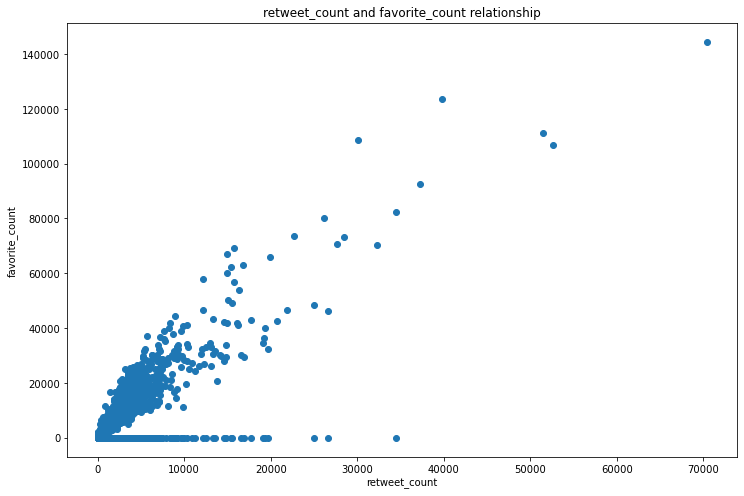

In [119]:
plt.figure(figsize=(12, 8))
plt.scatter(x = twitter_archive['retweet_count'], y = twitter_archive['favorite_count'])
plt.title('retweet_count and favorite_count relationship')
plt.xlabel('retweet_count')
plt.ylabel('favorite_count')


### Q3:  What is the most common medium used in Tweeting?

In [120]:
# most common platform used in Tweeting
twitter_archive.source.value_counts()

iPhone       2034
Vine         91  
Web          31  
TweetDeck    10  
Name: source, dtype: int64

IPhone shows to be the most used platfrom used for tweeting with over 2k tweets coming from iphone

### Visualization

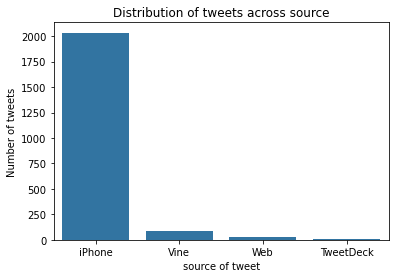

In [121]:
base_color = sb.color_palette()[0]
source_order = twitter_archive['source'].value_counts().index
sb.countplot(data = twitter_archive, x = 'source', color = base_color, order = source_order)

# Labeling the axes
plt.xlabel('source of tweet')
plt.ylabel('Number of tweets')
plt.title('Distribution of tweets across source');

###   Q6: Top Favourite dog breed

In [128]:
# extract a dataset to get the favourite dog breed
Fav_dogbreed = twitter_archive.loc[:,['favorite_count','jpg_url','rating_numerator','prediction1']]

In [129]:
Fav_dogbreed.head(3)

,favorite_count,jpg_url,rating_numerator,prediction1
0,33708,https://pbs.twimg.com/media/DGKD1-bXoAAIAUK.jpg,13.0,orange
1,29230,https://pbs.twimg.com/media/DGGmoV4XsAAUL6n.jpg,13.0,chihuahua
2,21979,https://pbs.twimg.com/media/DGBdLU1WsAANxJ9.jpg,12.0,chihuahua


In [130]:
Fav_dogbreed.drop_duplicates()

,favorite_count,jpg_url,rating_numerator,prediction1
0,33708,https://pbs.twimg.com/media/DGKD1-bXoAAIAUK.jpg,13.0,orange
1,29230,https://pbs.twimg.com/media/DGGmoV4XsAAUL6n.jpg,13.0,chihuahua
2,21979,https://pbs.twimg.com/media/DGBdLU1WsAANxJ9.jpg,12.0,chihuahua
3,36803,https://pbs.twimg.com/media/DF_q7IAWsAEuuN8.jpg,13.0,paper_towel
4,35189,https://pbs.twimg.com/media/DF6hr6BUMAAzZgT.jpg,12.0,basset
...,...,...,...,...
2321,88,https://pbs.twimg.com/media/CT5IQmsXIAAKY4A.jpg,5.0,miniature_pinscher
2322,246,https://pbs.twimg.com/media/CT5Dr8HUEAA-lEu.jpg,6.0,rhodesian_ridgeback
2323,100,https://pbs.twimg.com/media/CT4521TWwAEvMyu.jpg,9.0,german_shepherd
2324,112,https://pbs.twimg.com/media/CT42GRgUYAA5iDo.jpg,7.0,redbone


In [131]:
# sort by favourite count
Fav_dogbreed.sort_values(by = 'favorite_count', ascending = False, inplace = True)
sum(Fav_dogbreed.duplicated())

88

In [132]:
Fav_dogbreed = Fav_dogbreed.drop_duplicates()

In [133]:
Fav_dogbreed.head()

,favorite_count,jpg_url,rating_numerator,prediction1
1010,144305,https://pbs.twimg.com/ext_tw_video_thumb/744234667679821824/pu/img/1GaWmtJtdqzZV7jy.jpg,13.0,labrador_retriever
395,123713,https://pbs.twimg.com/media/C2tugXLXgAArJO4.jpg,13.0,lakeland_terrier
515,111240,https://pbs.twimg.com/ext_tw_video_thumb/807106774843039744/pu/img/8XZg1xW35Xp2J6JW.jpg,13.0,chihuahua
129,108540,https://pbs.twimg.com/media/DAZAUfBXcAAG_Nn.jpg,13.0,french_bulldog
1050,106834,https://pbs.twimg.com/ext_tw_video_thumb/739238016737267712/pu/img/-tLpyiuIzD5zR1et.jpg,13.0,eskimo_dog


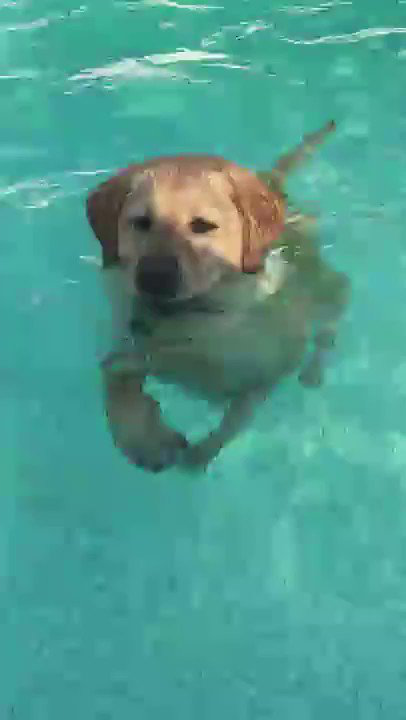

In [135]:
#Dog with the most like
url = Fav_dogbreed.jpg_url.iloc[0]
r = requests.get(url)
Image.open(BytesIO(r.content))

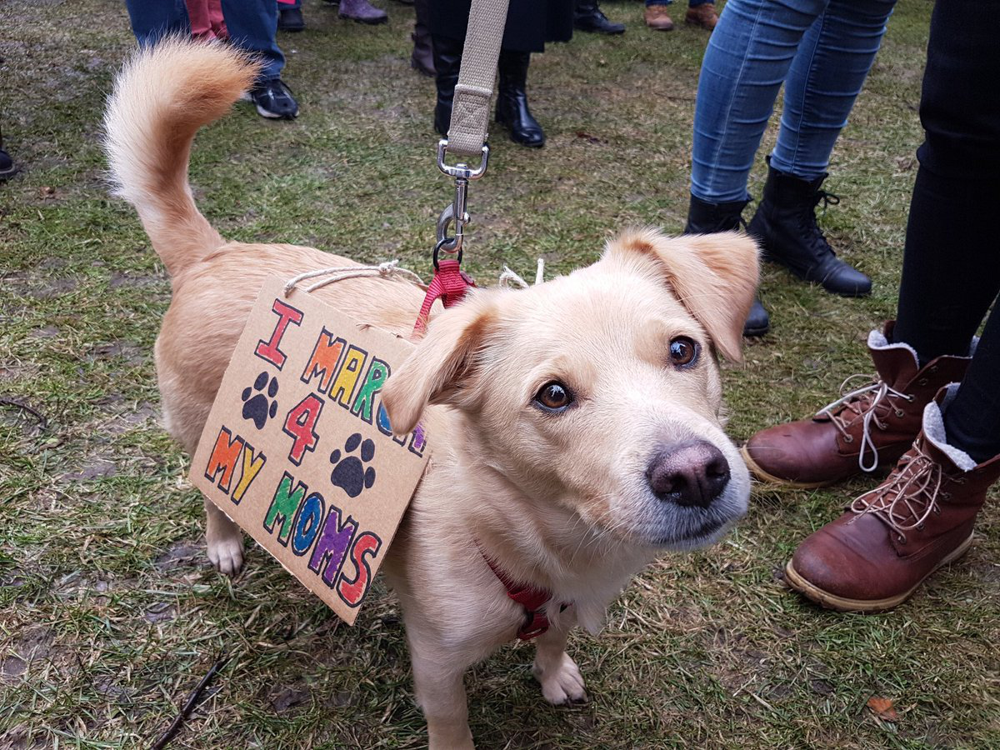

In [137]:
#Dog with the most like
url = Fav_dogbreed.jpg_url.iloc[1]
r = requests.get(url)
Image.open(BytesIO(r.content))

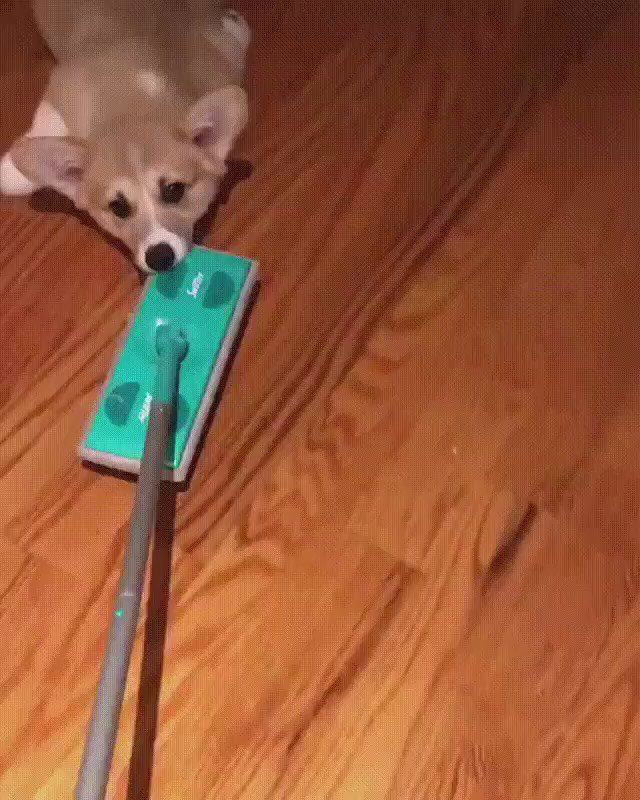

In [138]:
#Dog with the most like
url = Fav_dogbreed.jpg_url.iloc[2]
r = requests.get(url)
Image.open(BytesIO(r.content))

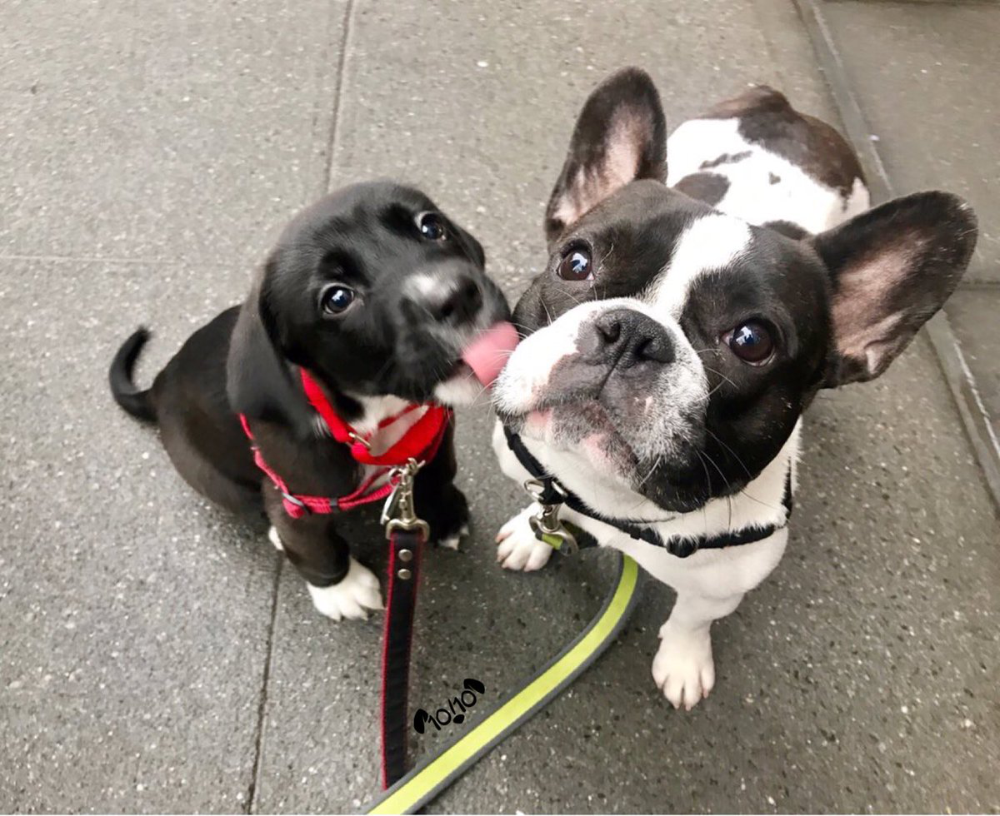

In [139]:
#Dog with the most like
url = Fav_dogbreed.jpg_url.iloc[3]
r = requests.get(url)
Image.open(BytesIO(r.content))

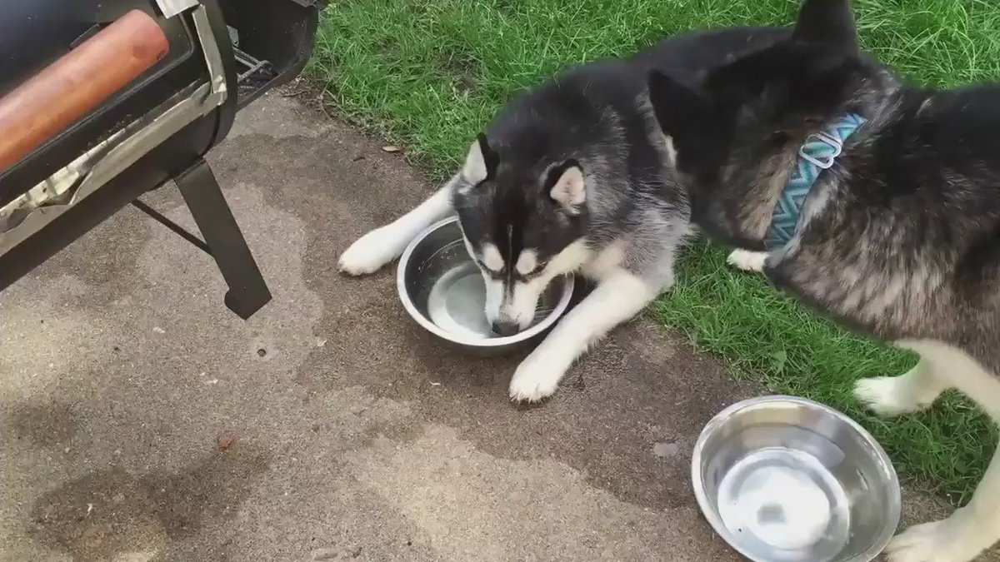

In [140]:
#Dog with the most like
url = Fav_dogbreed.jpg_url.iloc[4]
r = requests.get(url)
Image.open(BytesIO(r.content))

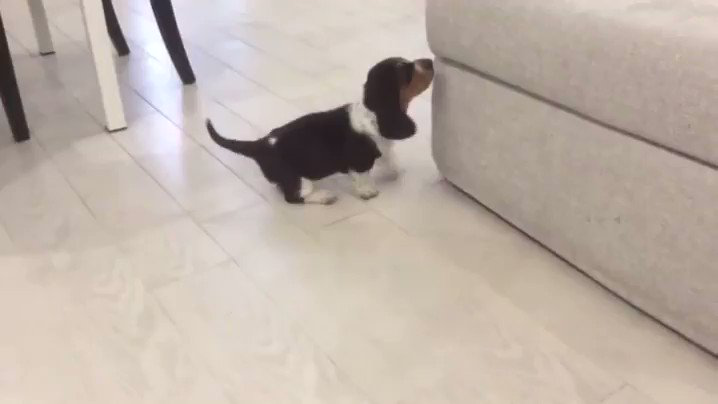

In [141]:
#Dog with the most like
url = Fav_dogbreed.jpg_url.iloc[5]
r = requests.get(url)
Image.open(BytesIO(r.content))

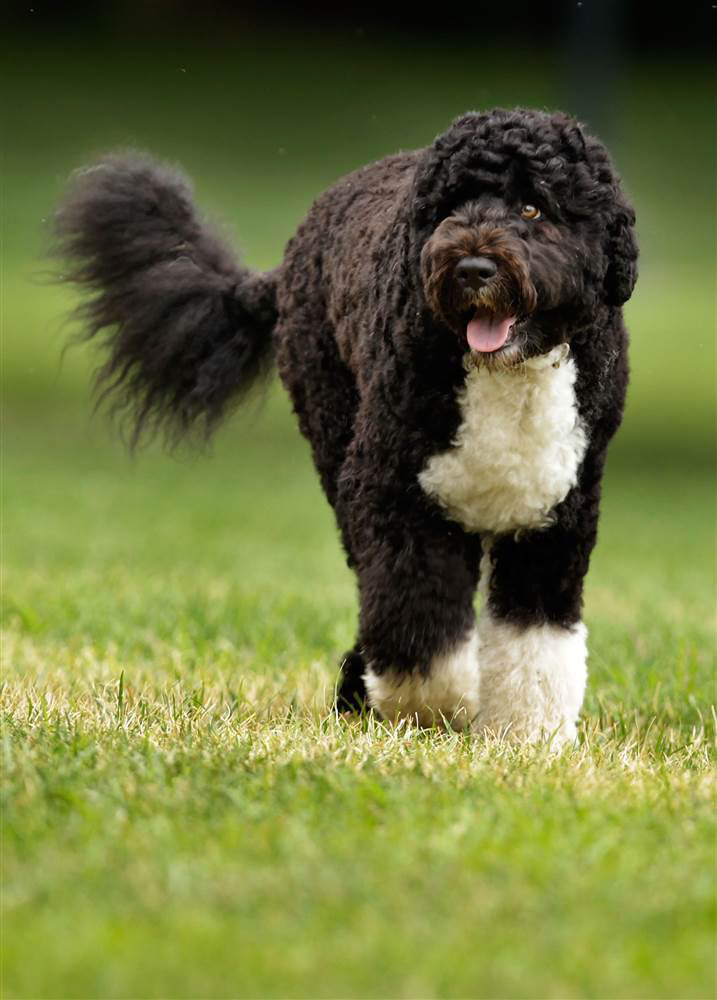

In [142]:
#Dog with the most like
url = Fav_dogbreed.jpg_url.iloc[6]
r = requests.get(url)
Image.open(BytesIO(r.content))

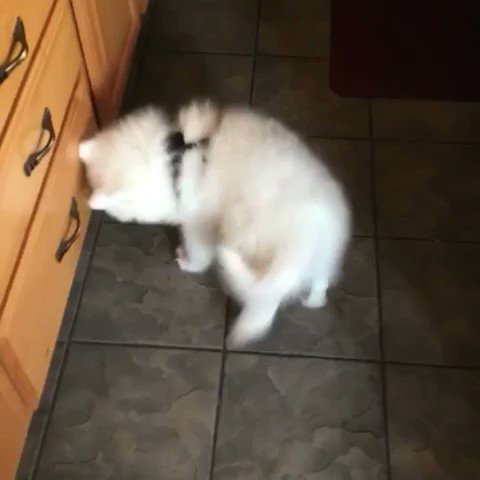

In [143]:
#Dog with the most like
url = Fav_dogbreed.jpg_url.iloc[7]
r = requests.get(url)
Image.open(BytesIO(r.content))

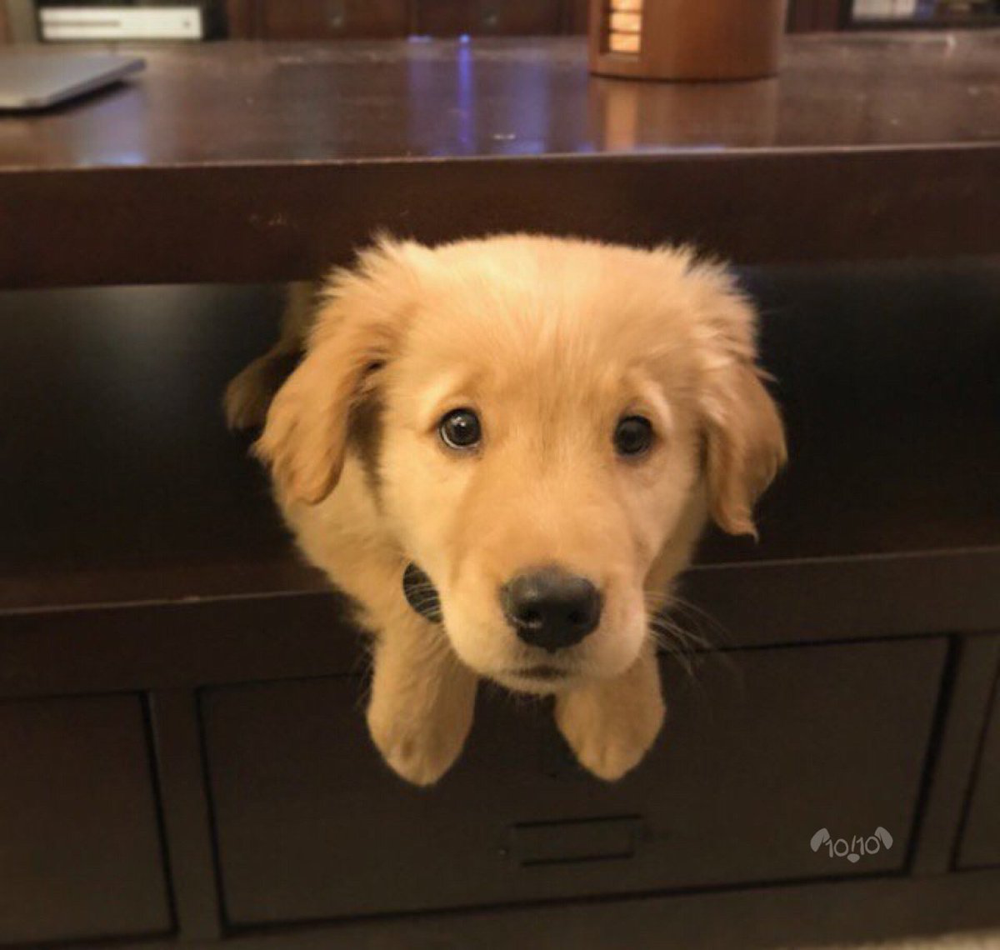

In [144]:
#Dog with the most like
url = Fav_dogbreed.jpg_url.iloc[8]
r = requests.get(url)
Image.open(BytesIO(r.content))

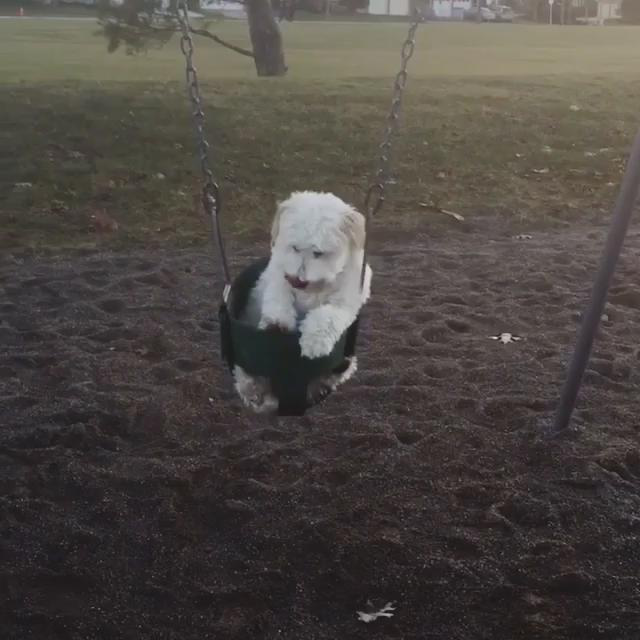

In [145]:
#Dog with the most like
url = Fav_dogbreed.jpg_url.iloc[9]
r = requests.get(url)
Image.open(BytesIO(r.content))

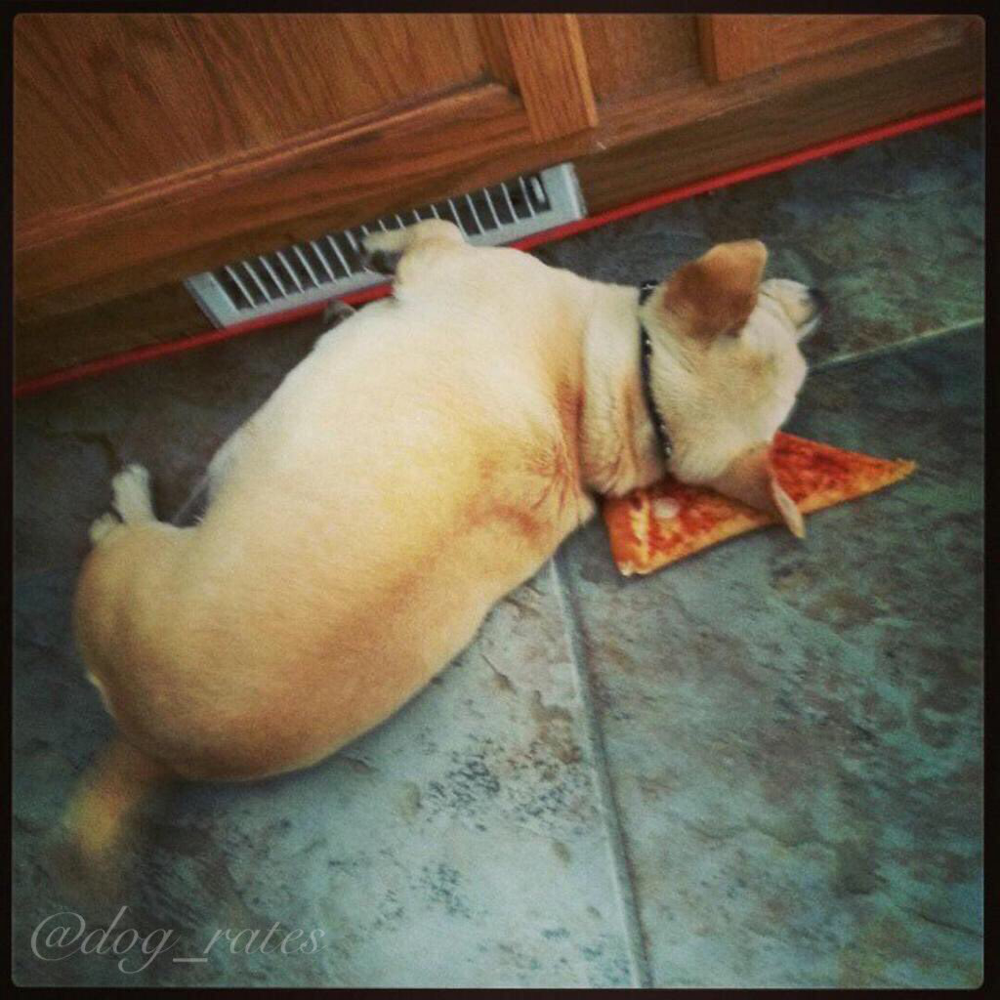

In [136]:
#Least like
url = Fav_dogbreed.jpg_url.iloc[-1]
r = requests.get(url)
Image.open(BytesIO(r.content))

### Insights: 

- Majority of the dogs do not have a name with either None or A entered the most. The most common names are Charlie, Cooper, Lucy and Oliver with 10 dogs each bearing these names

- A correlation of 0.80 shows a strong positive relationship between retweet count and favourite count.

- IPhone shows to be the most used platfrom used for tweeting with over 2k tweets coming from iphone